In [605]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import silhouette_score
from matplotlib.lines import Line2D
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# data imports

* Residential Energy Consumption Survey (RECS) - Residential Energy Consumption Survey (RECS)
* Starting from the survey on US household consumption(https://www.eia.gov/consumption/residential/data/2020/index.php?view=microdata&utm_source=chatgpt.com), electricity and gas consumption will be analysed for different categories, with the aim of classifying consumers into clusters based on this two main energy sources

In [304]:
np.random.seed(42)

In [305]:
energy_complete = pd.read_csv('recs2020.csv')

In [306]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
1,100002,SOUTH,West South Central,5,AR,Arkansas,Mixed-Humid,4A,U,3766,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
2,100003,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3819,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
4,100005,NORTHEAST,Middle Atlantic,34,NJ,New Jersey,Mixed-Humid,4A,U,4219,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18491,118492,SOUTH,South Atlantic,24,MD,Maryland,Mixed-Humid,4A,U,4572,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18493,118494,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,405,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


In [307]:
energy_complete.columns

Index(['DOEID', 'REGIONC', 'DIVISION', 'STATE_FIPS', 'state_postal',
       'state_name', 'BA_climate', 'IECC_climate_code', 'UATYP10', 'HDD65',
       ...
       'EVCHRGHOME', 'EVCHRGAPT', 'EVCHRGWKS', 'EVCHRGBUS', 'EVCHRGMUNI',
       'EVCHRGDLR', 'EVCHRGHWY', 'EVCHRGOTH', 'EVHOMEAMT', 'EVCHRGTYPE'],
      dtype='object', length=799)

In [308]:
energy_complete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18496 entries, 0 to 18495
Columns: 799 entries, DOEID to EVCHRGTYPE
dtypes: float64(243), int64(549), object(7)
memory usage: 112.7+ MB


## selecting the features

* 1 Mobile home
* 2 Single-family house detached from any other house 
* 3 Single-family house attached to one or more other houses (for example: duplex, row house, or townhome)
* 4 Apartment in a building with 2 to 4 units
* 5 Apartment in a building with 5 or more units

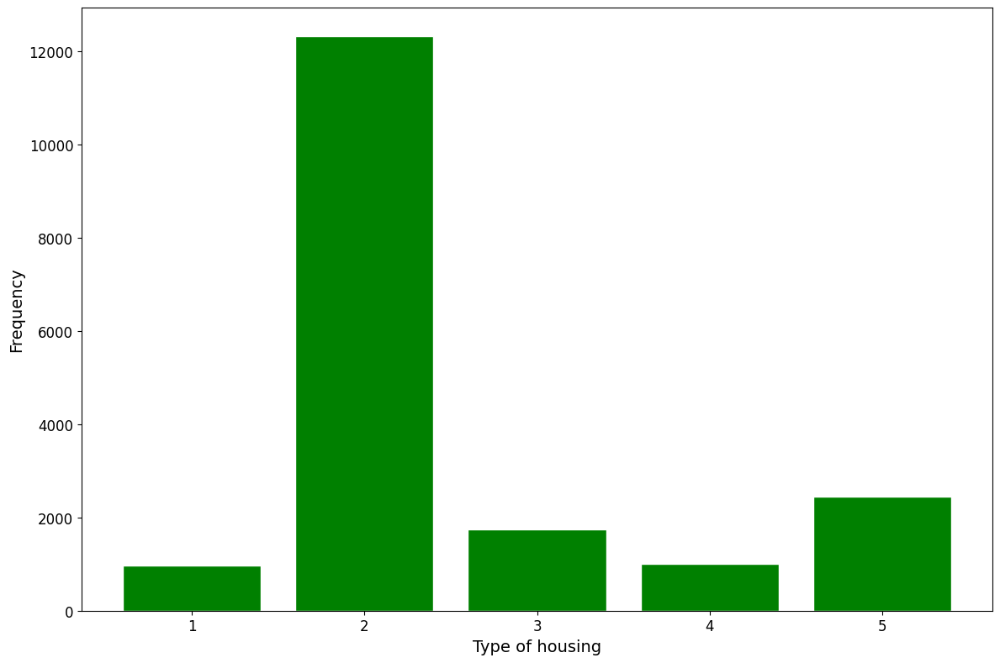

In [309]:
counts = energy_complete['TYPEHUQ'].value_counts().sort_index()

plt.figure(figsize=(12, 8))
plt.bar(counts.index.astype(str), counts.values, color='green', edgecolor='white')

plt.xlabel('Type of housing', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [310]:
energy_complete = energy_complete[energy_complete['TYPEHUQ'] == 2.0]

In [311]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
5,100006,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,901,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
6,100007,SOUTH,West South Central,40,OK,Oklahoma,Mixed-Humid,3A,U,3148,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
10,100011,WEST,Pacific,6,CA,California,Hot-Dry,3B,U,1467,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18488,118489,SOUTH,South Atlantic,12,FL,Florida,Hot-Humid,2A,R,184,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18489,118490,SOUTH,South Atlantic,51,VA,Virginia,Mixed-Humid,4A,R,4856,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


* 0 Not imputed
* 1 Imputed amount and cost
* 2 Imputed only amount for SOLAR=1 cases

In [312]:
energy_complete['ZELAMOUNT'].value_counts() # electricty

ZELAMOUNT
0    11054
1      893
2      372
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no natural gas use

In [313]:
energy_complete['ZNGAMOUNT'].value_counts() # gas

ZNGAMOUNT
 0    7012
-2    4565
 1     742
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no propane use

In [314]:
energy_complete['ZLPAMOUNT'].value_counts() # propane

ZLPAMOUNT
-2    10703
 1      843
 0      773
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no fuel oil/kerosene use

In [315]:
energy_complete['ZFOAMOUNT'].value_counts() # oil/kerosene

ZFOAMOUNT
-2    11339
 0      561
 1      419
Name: count, dtype: int64

In [316]:
cols_to_keep = [ 
                # Electricity usage measured in kilowatt-hours
                'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
                'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
                'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
                'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
                'KWHWTH', # Calibrated electricity usage for water heating, main and secondary, in kilowatthours, 2020 
                'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
                'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
                'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
                'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
                'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
                'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
                'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
                'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020

                
                # Gas usage measured in thousand BTU
                'BTUNGSPH', # Calibrated natural gas usage for space heating, main and secondary, in thousand Btu, 2020
                'BTUNGWTH', # Calibrated natural gas usage for water heating, main and secondary, in thousand Btu, 2020
                'BTUNGCOK', # Calibrated natural gas usage for cooking (cooktops, ovens, and ranges), in thousand Btu, 2020
                'BTUNGOTH', # Calibrated natural gas usage for end uses other than space heating and water heating, in thousand Btu, 2020
                

                'TOTSQFT_EN' # Total energy-consuming area (square footage) of the housing unit. Includes all main living areas; all basements; heated, cooled, or finished attics; and heating or cooled garages
]

In [317]:
energy = energy_complete[cols_to_keep].copy()

In [318]:
energy['Tot_heating_elec'] = energy['KWHSPH'] + energy['KWHAHUHEAT']

In [319]:
energy['Tot_cooling_elec'] = energy['KWHCOL'] + energy['KWHAHUCOL']

In [320]:
energy['Tot_refrigeretor_elec'] = energy['KWHRFG'] + energy['KWHFRZ']

In [321]:
energy['Tot_cooking_elec'] = energy['KWHCOK'] + energy['KWHMICRO']

In [322]:
energy['Tot_appliances_elec'] = energy['KWHCW'] + energy['KWHCDR'] + energy['KWHDWH'] + energy['KWHTVREL']

In [323]:
energy.rename(columns={'KWHWTH':'Tot_waterheat_elec', 'BTUNGSPH':'Tot_heating_gas',
                       'BTUNGWTH':'Tot_waterheat_gas','BTUNGCOK':'Tot_cooking_gas',
                       'BTUNGOTH':'Tot_appliances_gas'},inplace=True)

In [324]:
gas_cols = ['Tot_heating_gas', 'Tot_waterheat_gas', 'Tot_cooking_gas', 'Tot_appliances_gas']

# conversion from kBtu to kWh
for col in gas_cols:
    energy[col] = energy[col] * 0.29307107

In [325]:
energy.drop([
            'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
            'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
            'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
            'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
            'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
            'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
            'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
            'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
            'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
            'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
            'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
            'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020
],axis=1,inplace=True)

In [326]:
energy

,Tot_waterheat_elec,Tot_heating_gas,Tot_waterheat_gas,Tot_cooking_gas,Tot_appliances_gas,TOTSQFT_EN,Tot_heating_elec,Tot_cooling_elec,Tot_refrigeretor_elec,Tot_cooking_elec,Tot_appliances_elec
0,0.00,21670.313811,6225.222242,1975.559845,1975.559845,2100,309.06,3920.66,1767.81,374.14,3847.64
3,0.00,9552.812716,6172.431350,428.434736,428.434736,2100,3308.71,1760.83,965.40,473.72,1718.97
5,0.00,4267.522148,5717.294909,0.000000,692.597275,4520,89.56,8272.06,1374.54,1315.51,632.31
6,0.00,20104.854175,4064.154271,0.000000,0.000000,2100,3751.47,5675.82,707.12,540.04,1902.81
10,0.00,6511.672837,2997.809321,0.000000,0.000000,1630,161.44,2767.98,1310.01,129.82,641.97
...,...,...,...,...,...,...,...,...,...,...,...
18488,1761.98,0.000000,0.000000,0.000000,0.000000,2490,0.00,4602.96,1887.11,449.72,1643.96
18489,261.84,0.000000,0.000000,0.000000,0.000000,1850,573.89,121.95,120.09,72.50,228.00
18492,0.00,0.000000,0.000000,0.000000,0.000000,3070,1468.09,938.13,610.62,254.21,527.51
18494,1603.47,0.000000,0.000000,0.000000,0.000000,3000,1469.98,6742.96,2140.54,196.55,511.59


<Axes: >

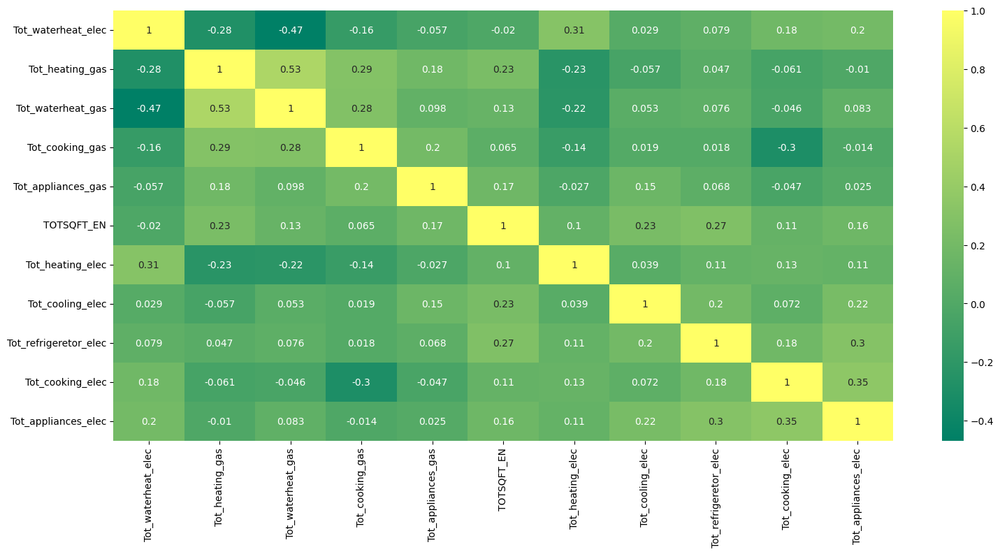

In [327]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

In [328]:
for col in energy.columns:
    if col != 'TOTSQFT_EN':
        energy[col + '_EUI'] = energy[col] / energy['TOTSQFT_EN']

In [329]:
energy.drop('TOTSQFT_EN',axis=1,inplace=True)

In [330]:
for col in energy.columns:
    if 'EUI' not in col:
        energy.drop(col,axis=1,inplace=True)

In [331]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,0.000000,10.319197,2.964392,0.940743,0.940743,0.147171,1.866981,0.841814,0.178162,1.832210
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
...,...,...,...,...,...,...,...,...,...,...
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827
18494,0.534490,0.000000,0.000000,0.000000,0.000000,0.489993,2.247653,0.713513,0.065517,0.170530


<Axes: >

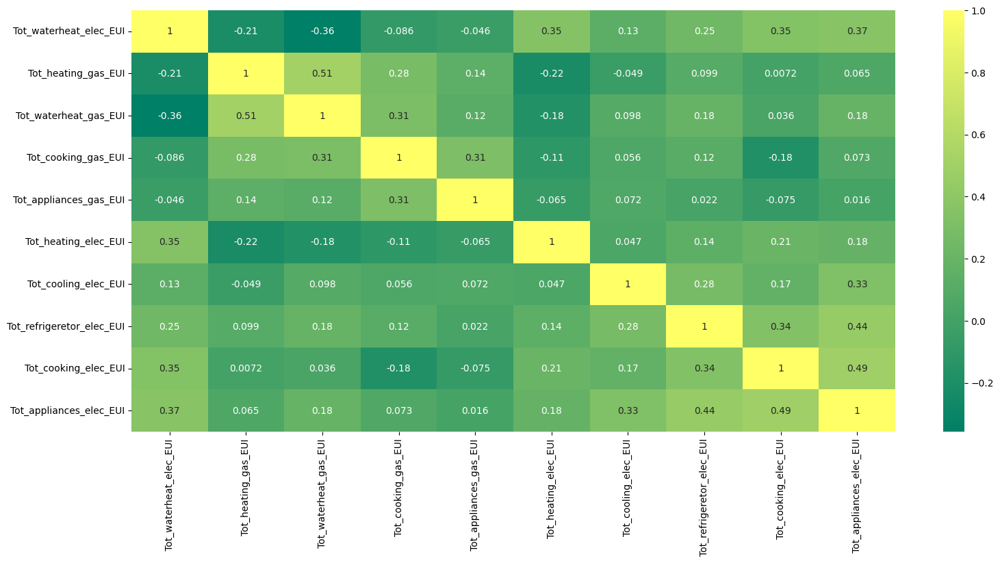

In [332]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

## missing values and duplicates

In [333]:
energy.isna().sum()

Tot_waterheat_elec_EUI       0
Tot_heating_gas_EUI          0
Tot_waterheat_gas_EUI        0
Tot_cooking_gas_EUI          0
Tot_appliances_gas_EUI       0
Tot_heating_elec_EUI         0
Tot_cooling_elec_EUI         0
Tot_refrigeretor_elec_EUI    0
Tot_cooking_elec_EUI         0
Tot_appliances_elec_EUI      0
dtype: int64

In [334]:
energy.duplicated().sum()

0

## outlier removal

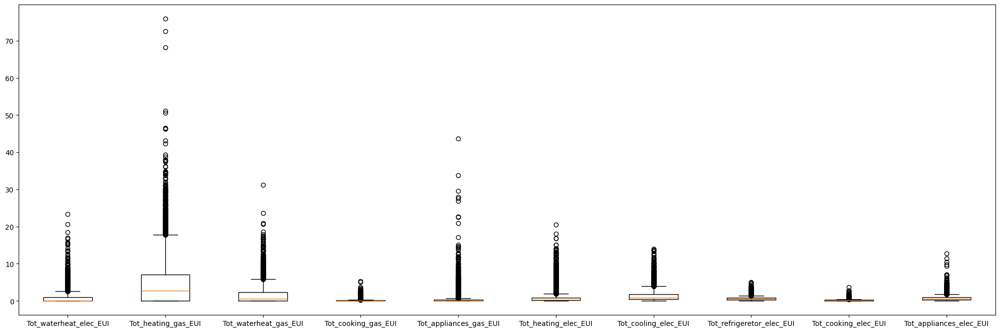

In [335]:
plt.figure(figsize=(25,8))
plt.boxplot(energy,tick_labels=energy.columns)
plt.show()

In [336]:
Q1 = energy.quantile(0.25)
Q3 = energy.quantile(0.75)
IQR = Q3 - Q1

energy = energy[~((energy < (Q1 - 1.5 * IQR)) | (energy > (Q3 + 1.5 * IQR))).any(axis=1)]

In [337]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


## data standardization

In [338]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


In [339]:
scaler = StandardScaler()

In [340]:
energy_scaled = scaler.fit_transform(energy)

In [341]:
np.mean(energy_scaled),np.std(energy_scaled)

(-2.066404952771019e-17, 1.0)

In [342]:
energy_scaled = pd.DataFrame(energy_scaled,columns=energy.columns)

In [343]:
energy_scaled

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921
...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488


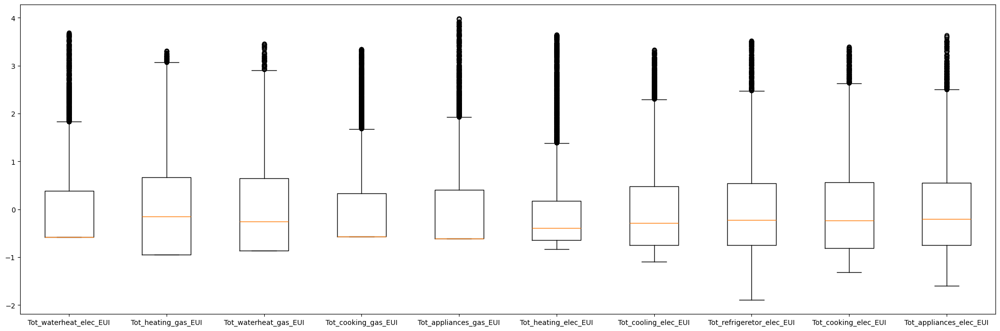

In [344]:
plt.figure(figsize=(25,8))
plt.boxplot(energy_scaled,tick_labels=energy_scaled.columns)
plt.show()

# dimensionality reduction algorithms

## pca 

In [345]:
pca_general = PCA()

In [346]:
pca_general.fit(energy_scaled)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [347]:
explained_variance = pca_general.explained_variance_ratio_

In [348]:
explained_variance

array([0.28032367, 0.18895147, 0.12704675, 0.08532331, 0.08169869,
       0.0685402 , 0.05957754, 0.05518687, 0.03189739, 0.02145411])

In [349]:
eigenvalues = pca_general.explained_variance_

In [350]:
eigenvalues

array([2.80363199, 1.88978112, 1.27064668, 0.85335345, 0.81710212,
       0.68549867, 0.59585945, 0.55194648, 0.31901889, 0.21457139])

In [351]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[2.8036319885511203, 1.889781124146604, 1.270646681554841]


In [352]:
N_COMPONENTS = len(selected_components)

In [353]:
eigenvectors = pca_general.components_

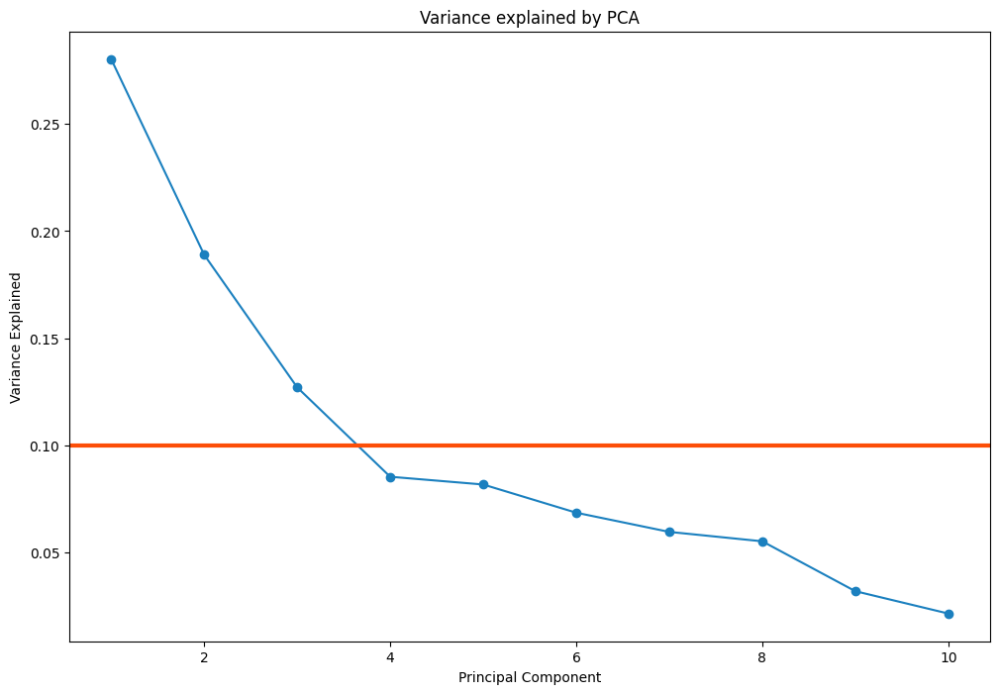

In [354]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [355]:
pca = PCA(n_components=N_COMPONENTS)

In [356]:
X_pca = pca.fit_transform(energy_scaled)

In [357]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [358]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [359]:
X_pca

,dim_1,dim_2,dim_3
0,0.886679,1.363975,1.186636
1,-0.110236,-0.167015,-0.663318
2,-0.966315,2.136664,0.196361
3,0.073670,0.551620,-0.449555
4,1.649792,1.775372,1.256657
...,...,...,...
7087,-2.202718,1.358424,1.035535
7088,-1.573662,0.599975,0.321832
7089,-0.416653,-2.763515,-0.690737
7090,-0.618345,-2.158439,-0.582987


## t-SNE

In [360]:
tsne = TSNE(n_components=2,random_state=42)

In [361]:
X_tsne = tsne.fit_transform(energy_scaled)

In [362]:
tsne_columns = [f'dim_{i+1}' for i in range(2)]

In [363]:
X_tsne = pd.DataFrame(X_tsne, columns=tsne_columns)

In [364]:
X_tsne

,dim_1,dim_2
0,55.915588,-4.499386
1,-18.135302,56.300133
2,-29.342825,41.306011
3,-3.121587,40.886963
4,73.028496,17.787270
...,...,...
7087,-43.445213,-3.837628
7088,-35.263420,12.993477
7089,-9.176323,-71.482231
7090,-13.433419,-69.690445


## umap

In [365]:
umap = umap.UMAP(n_components=3,random_state=42)

In [366]:
X_umap = umap.fit_transform(energy_scaled)

In [367]:
umap_columns = [f'dim_{i+1}' for i in range(3)]

In [368]:
X_umap = pd.DataFrame(X_umap, columns=umap_columns)

In [369]:
X_umap

,dim_1,dim_2,dim_3
0,8.540884,5.635366,8.092696
1,6.674550,7.703112,4.661761
2,8.055438,8.882436,5.173176
3,7.841428,6.987625,5.274173
4,9.224665,5.318230,7.319454
...,...,...,...
7087,0.898640,4.104914,6.800636
7088,0.870373,5.136365,5.973392
7089,-0.109102,8.384296,7.264081
7090,-0.318984,7.911990,6.649530


# clustering algorithms

## k-means 

In [606]:
N_CLUSTER = 4

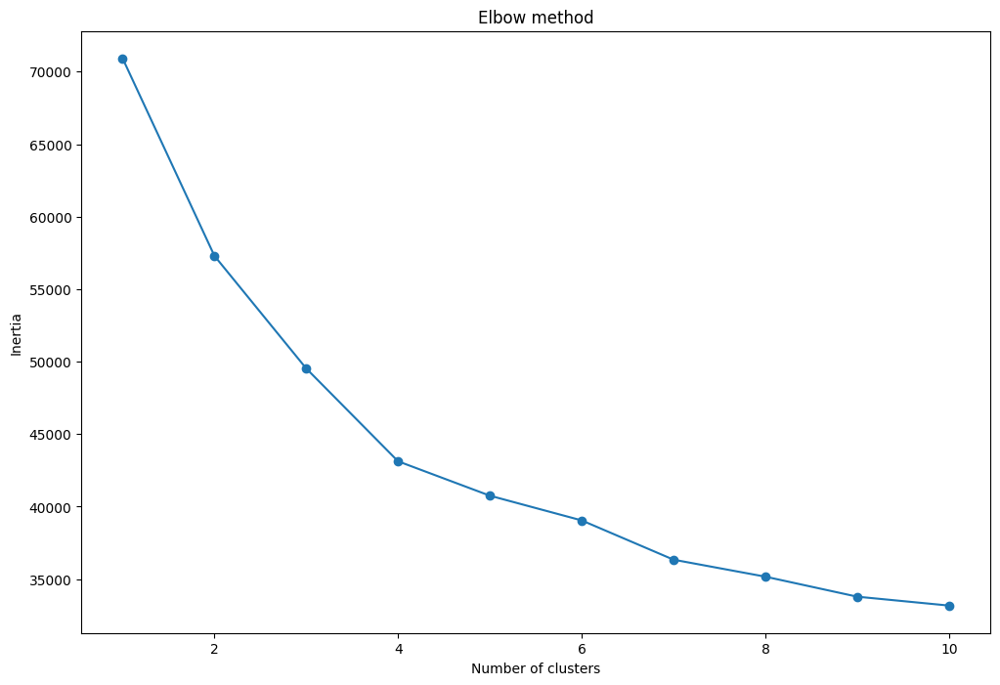

In [607]:
data = energy_scaled
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.18269024948101842
For n_clusters = 3 The average silhouette_score is : 0.18070141740958368
For n_clusters = 4 The average silhouette_score is : 0.1893983669463929
For n_clusters = 5 The average silhouette_score is : 0.18929502363089706
For n_clusters = 6 The average silhouette_score is : 0.1460722565117904


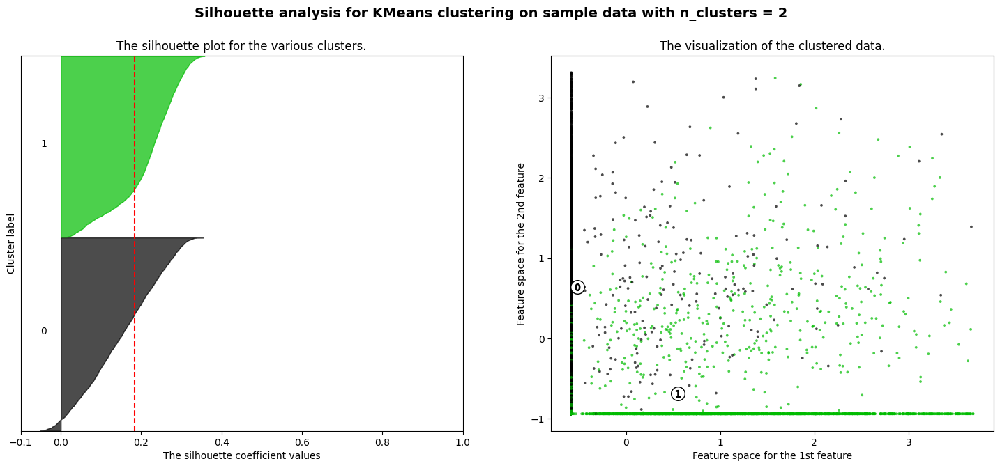

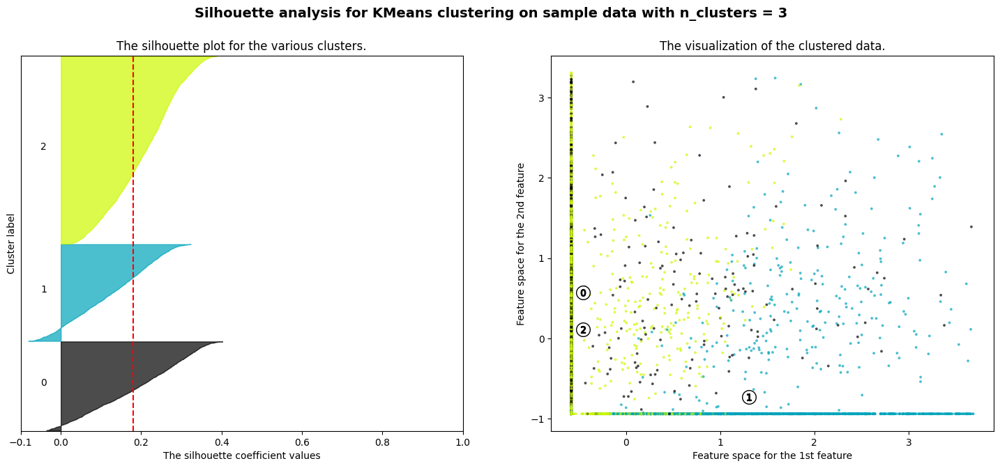

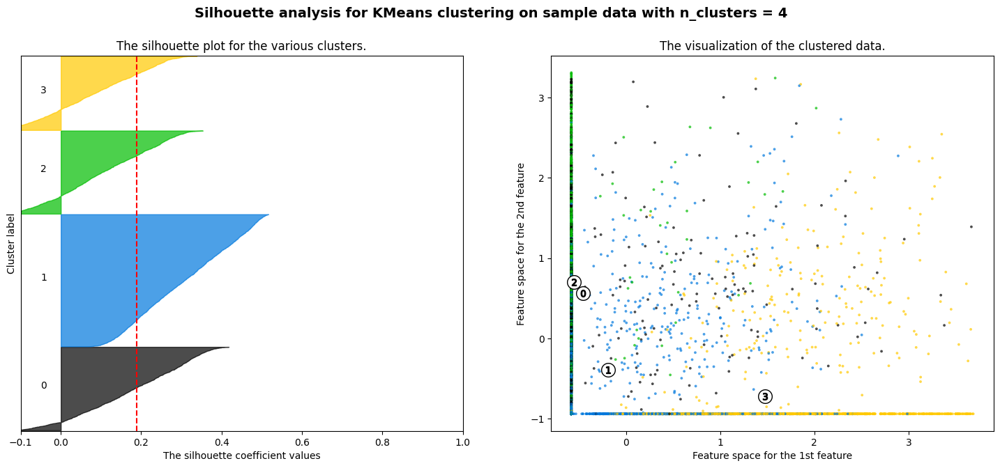

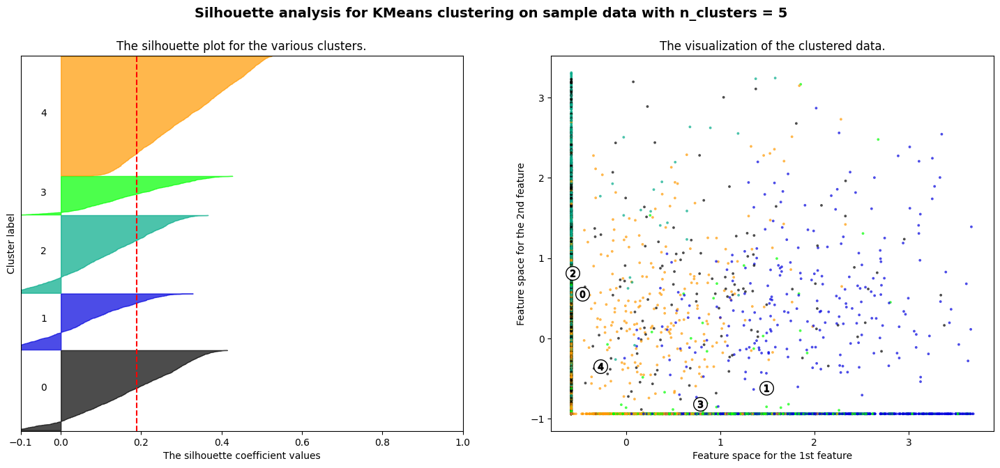

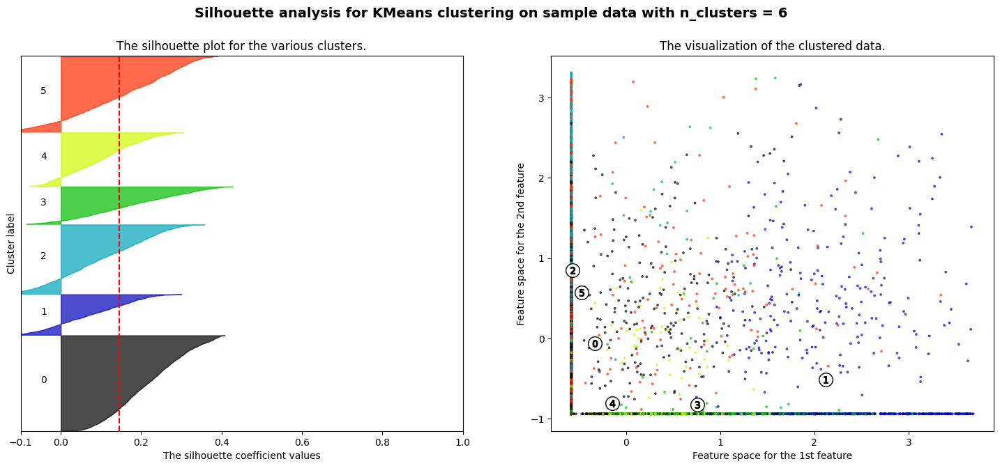

In [652]:
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(energy_scaled) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(energy_scaled)

    silhouette_avg = silhouette_score(energy_scaled, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    sample_silhouette_values = silhouette_samples(energy_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        energy_scaled.iloc[:, 0], energy_scaled.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    
    centers = clusterer.cluster_centers_
    
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [608]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [609]:
kmeans.fit(energy_scaled)

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [610]:
df_kmeans = energy_scaled.copy()

In [611]:
df_kmeans['k_means'] = kmeans.labels_

In [612]:
df_kmeans

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,k_means
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,1
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,3
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,2
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


In [613]:
df_kmeans['k_means'].unique()

array([3, 1, 0, 2])

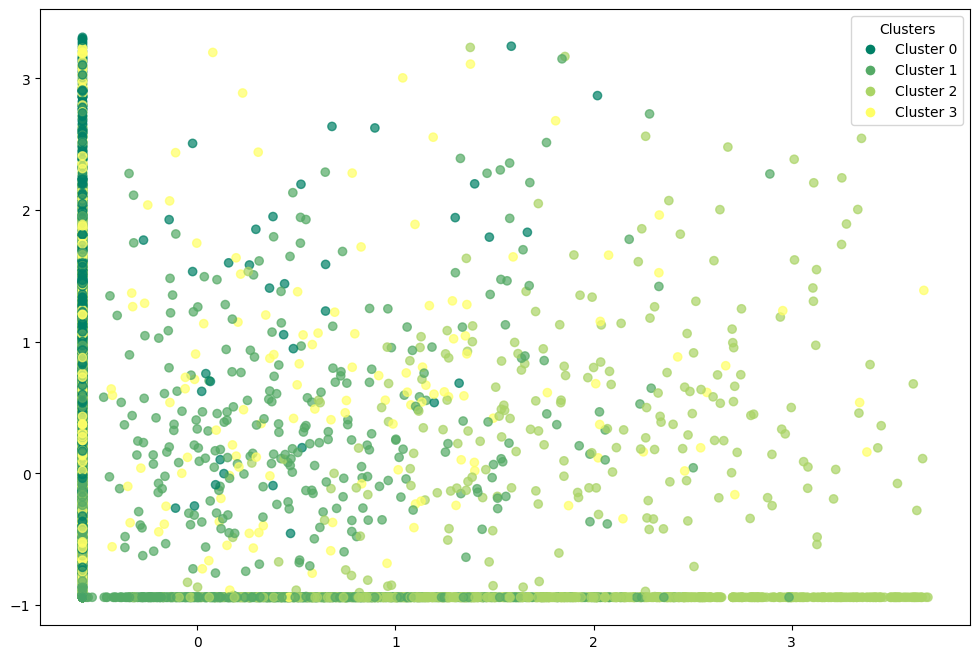

In [614]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [615]:
df_kmeans.groupby(df_kmeans['k_means']).mean() 

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
k_means,,,,,,,,,,
0,-0.554130,0.699238,0.918062,-0.413646,-0.337625,-0.227210,0.290554,0.482328,0.773800,0.678967
1,-0.189974,-0.393694,-0.512784,-0.446508,-0.440657,-0.259789,-0.421621,-0.482971,-0.331519,-0.530937
2,1.479630,-0.720994,-0.845399,-0.500539,-0.517279,1.042702,0.432065,0.424093,0.495468,0.482245
3,-0.459245,0.566108,0.647122,1.560277,1.490307,-0.286807,-0.004697,-0.091202,-0.683511,-0.262260


In [616]:
sil = silhouette_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
ch = calinski_harabasz_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
db = davies_bouldin_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.1894317628713091
Calinski-Harabasz: 1522.7897830722286
Davies-Bouldin: 1.6001635653633524


### k-means with pca

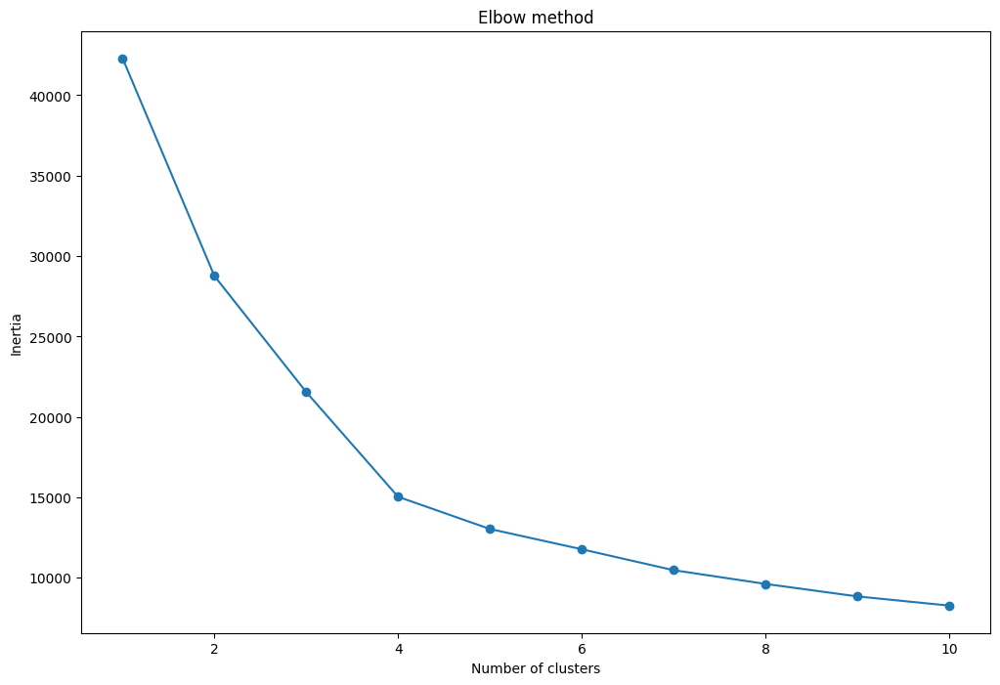

In [617]:
data = X_pca
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [618]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [619]:
kmeans_pca.fit(X_pca)

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [620]:
df_pca_kmeans = X_pca.copy()

In [621]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [622]:
df_pca_kmeans

,dim_1,dim_2,dim_3,kmeans_pca
0,0.886679,1.363975,1.186636,3
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,0
3,0.073670,0.551620,-0.449555,0
4,1.649792,1.775372,1.256657,3
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,1
7090,-0.618345,-2.158439,-0.582987,1


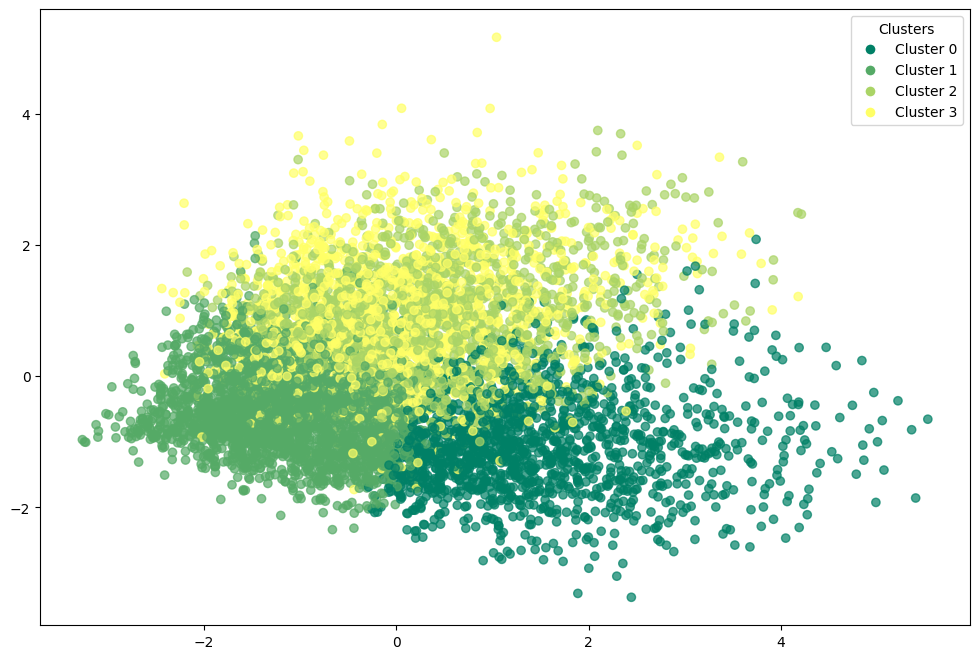

In [623]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 1], df_pca_kmeans.iloc[:, 2], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [624]:
df_pca_kmeans.groupby(df_pca_kmeans['kmeans_pca']).mean() 

,dim_1,dim_2,dim_3
kmeans_pca,,,
0,0.185071,1.535702,-1.051058
1,-0.358794,-1.145075,-0.511677
2,-2.090043,0.389628,0.949731
3,2.287861,0.002462,0.910183


In [625]:
energy_scaled['kmeans_pca'] = df_pca_kmeans['kmeans_pca']

In [626]:
energy_scaled.groupby(energy_scaled['kmeans_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_pca,,,,,,,,,,
0,-0.544934,0.737084,0.948752,-0.415896,-0.339214,-0.235854,0.260846,0.485355,0.814028,0.694360
1,-0.169271,-0.355107,-0.491197,-0.445074,-0.435093,-0.206751,-0.473590,-0.531372,-0.319381,-0.559163
2,1.353203,-0.758288,-0.843532,-0.507374,-0.522799,0.916340,0.508650,0.495428,0.478782,0.535494
3,-0.460580,0.557906,0.650751,1.541363,1.468578,-0.292102,0.032818,-0.073776,-0.694356,-0.261152


In [627]:
energy_scaled.drop('kmeans_pca',axis=1,inplace=True)

In [628]:
sil = silhouette_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
ch = calinski_harabasz_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
db = davies_bouldin_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3521392456609903
Calinski-Harabasz: 4281.504590030308
Davies-Bouldin: 0.9108969638367266


### k-means with t-SNE

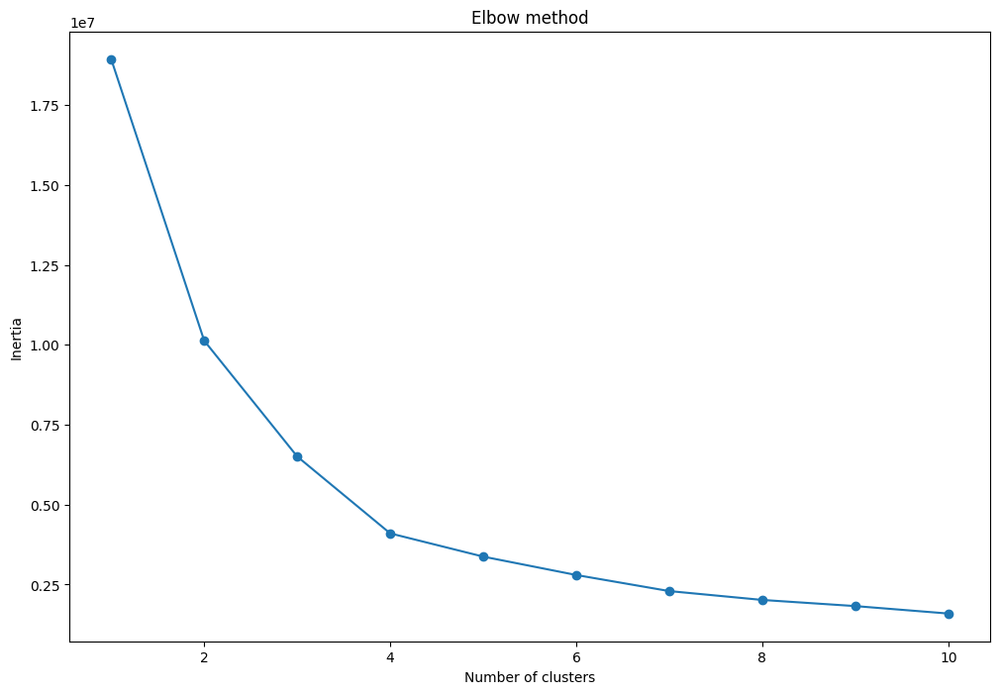

In [629]:
data = X_tsne
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [630]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [631]:
kmeans_tsne.fit(X_tsne)

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [632]:
df_tsne_kmeans = X_tsne.copy()

In [633]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [634]:
df_tsne_kmeans

,dim_1,dim_2,kmeans_tsne
0,55.915588,-4.499386,3
1,-18.135302,56.300133,0
2,-29.342825,41.306011,0
3,-3.121587,40.886963,0
4,73.028496,17.787270,3
...,...,...,...
7087,-43.445213,-3.837628,2
7088,-35.263420,12.993477,2
7089,-9.176323,-71.482231,1
7090,-13.433419,-69.690445,1


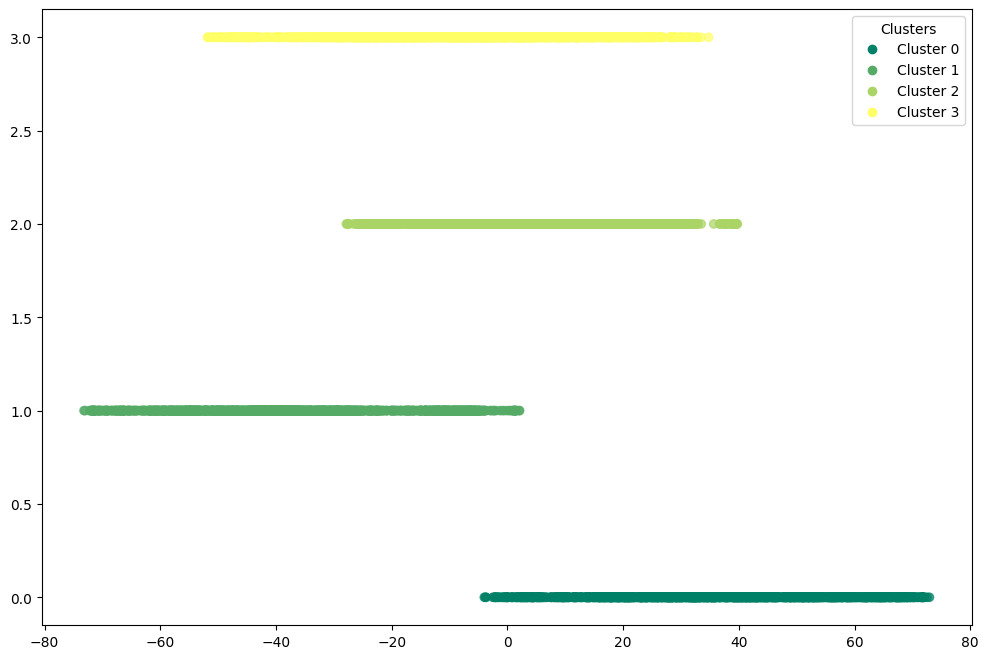

In [635]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 1], df_tsne_kmeans.iloc[:, 2], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [636]:
df_tsne_kmeans.groupby(df_tsne_kmeans['kmeans_tsne']).mean()

,dim_1,dim_2
kmeans_tsne,,
0,5.937872,36.824364
1,-18.333025,-36.895935
2,-54.006763,6.457988
3,48.157772,-7.579912


In [637]:
energy_scaled['kmeans_tsne'] = df_tsne_kmeans['kmeans_tsne']

In [638]:
energy_scaled.groupby(energy_scaled['kmeans_tsne']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_tsne,,,,,,,,,,
0,-0.566549,0.692196,0.818292,-0.527298,-0.382257,-0.209098,0.140874,0.189044,0.549654,0.316971
1,-0.019065,-0.667733,-0.803556,-0.540171,-0.568216,-0.385096,-0.569604,-0.215803,-0.171697,-0.327302
2,1.268894,-0.756680,-0.837566,-0.548190,-0.574267,1.102103,0.423428,0.198623,0.414351,0.294609
3,-0.405484,0.456897,0.510273,1.258121,1.173591,-0.313375,0.012122,-0.139282,-0.637051,-0.232497


In [639]:
energy_scaled.drop('kmeans_tsne',axis=1,inplace=True)

In [640]:
sil = silhouette_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
ch = calinski_harabasz_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
db = davies_bouldin_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4563695788383484
Calinski-Harabasz: 8549.979573207624
Davies-Bouldin: 0.7567516827968492


### k-means with umap

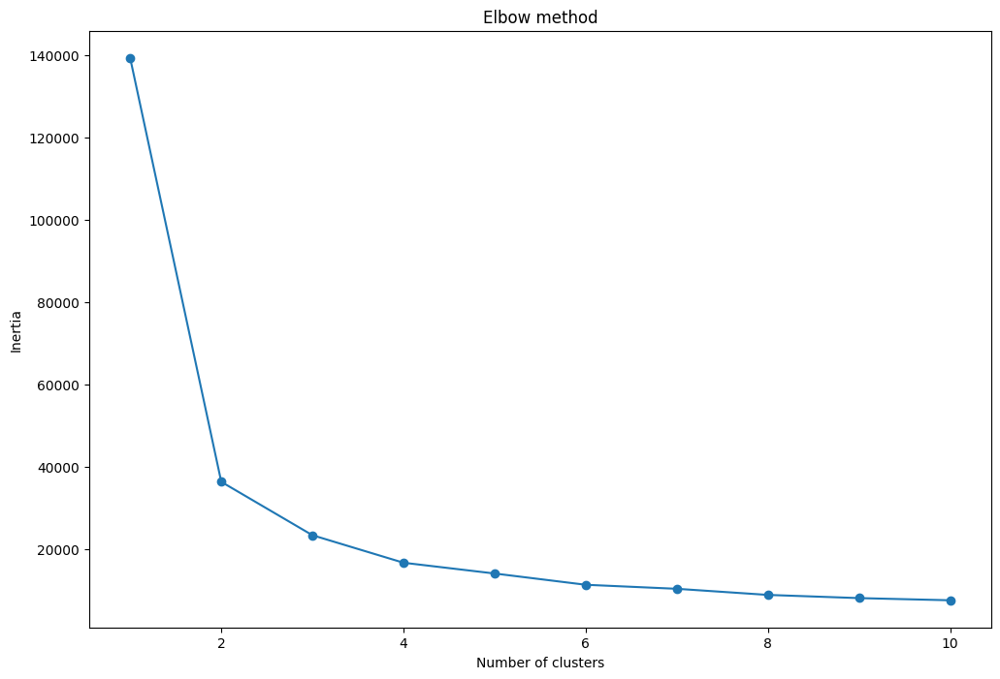

In [641]:
data = X_umap
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [642]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [643]:
kmeans_umap.fit(X_umap)

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [644]:
df_umap_kmeans = X_umap.copy()

In [645]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [646]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


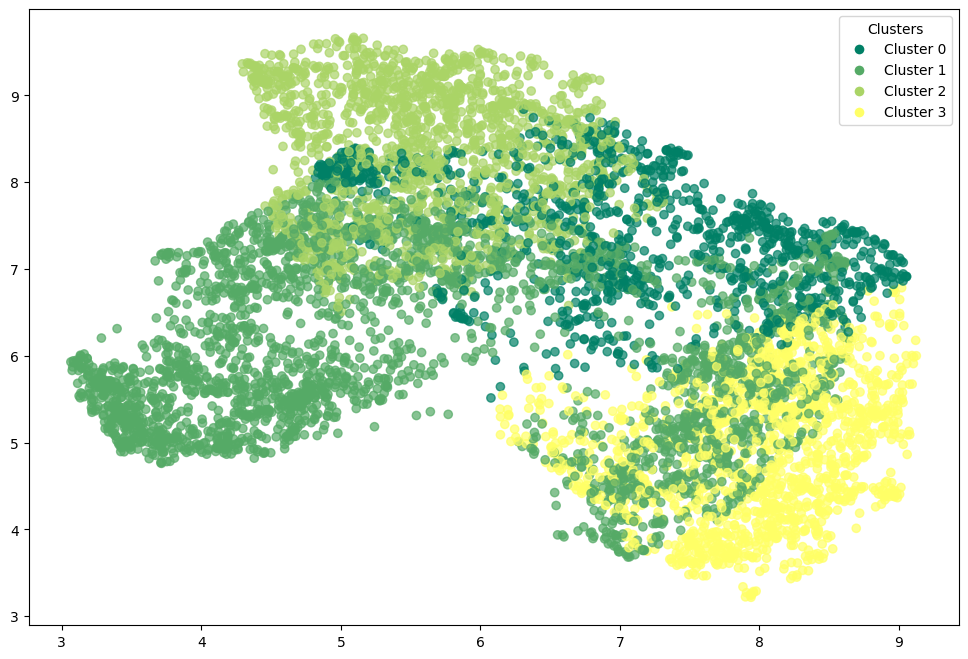

In [647]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 1], df_umap_kmeans.iloc[:, 2], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [648]:
energy_scaled['kmeans_umap'] = df_umap_kmeans['kmeans_umap']

In [649]:
energy_scaled.groupby(energy_scaled['kmeans_umap']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_umap,,,,,,,,,,
0,-0.235649,0.344240,0.035367,-0.058904,0.283890,-0.330118,-0.235235,-0.569723,-0.428420,-0.611185
1,0.652899,-0.765317,-0.856990,-0.551614,-0.584067,0.350817,-0.048464,0.034591,0.174365,0.052961
2,-0.550016,0.544988,0.756999,1.556966,1.367667,-0.281382,0.048929,0.005915,-0.637248,-0.133980
3,-0.571535,0.728863,0.919459,-0.532373,-0.515273,-0.168181,0.225455,0.354223,0.668831,0.502579


In [650]:
energy_scaled.drop('kmeans_umap',axis=1,inplace=True)

In [651]:
sil = silhouette_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
ch = calinski_harabasz_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
db = davies_bouldin_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.49262508749961853
Calinski-Harabasz: 13465.52155902078
Davies-Bouldin: 0.8779239380747454


## Birch

In [416]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [417]:
birch.fit(energy_scaled)

,threshold,1.5
,branching_factor,50
,n_clusters,4
,compute_labels,True
,copy,'deprecated'


In [418]:
df_birch = energy_scaled.copy()

In [419]:
df_birch['birch'] = birch.labels_

In [420]:
df_birch

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,birch
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,1
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,3
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,1
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,1
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


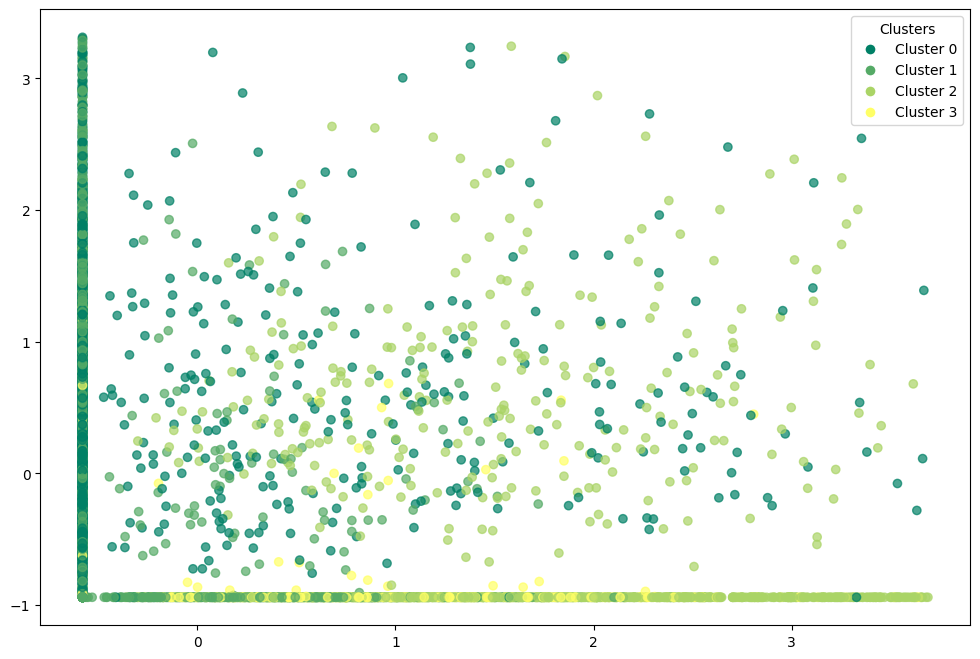

In [421]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [422]:
df_birch.groupby(df_birch['birch']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch,,,,,,,,,,
0,-0.415405,0.501443,0.460967,0.826529,0.876565,-0.346461,-0.124831,-0.233466,-0.510073,-0.368333
1,-0.368522,-0.111796,0.014266,-0.469457,-0.503398,-0.281453,0.070974,0.108826,0.290672,0.184433
2,1.786267,-0.527472,-0.863674,-0.554007,-0.574665,0.182341,0.129960,0.467529,0.481127,0.479969
3,0.470915,-0.688981,-0.554051,-0.426131,-0.448261,2.228577,-0.004720,-0.243584,0.052123,-0.054094


In [423]:
sil = silhouette_score(df_birch.iloc[:,:-1], df_birch['birch'])
ch = calinski_harabasz_score(df_birch.iloc[:,:-1], df_birch['birch'])
db = davies_bouldin_score(df_birch.iloc[:,:-1], df_birch['birch'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.11812790022843779
Calinski-Harabasz: 882.4931259048551
Davies-Bouldin: 2.1131880692082485


### Birch with pca

In [424]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [425]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,4
,compute_labels,True
,copy,'deprecated'


In [426]:
df_pca_birch = X_pca.copy()

In [427]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [428]:
df_pca_birch

,dim_1,dim_2,dim_3,birch_pca
0,0.886679,1.363975,1.186636,0
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,3
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


In [429]:
energy_scaled['birch_pca'] = df_pca_birch['birch_pca']

In [430]:
energy_scaled.groupby(energy_scaled['birch_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_pca,,,,,,,,,,
0,-0.395373,0.499818,0.581819,1.422949,1.375486,-0.265018,0.134048,-0.014730,-0.633337,-0.170150
1,-0.541725,0.587260,0.523433,-0.411229,-0.329020,-0.314084,-0.218739,-0.232978,0.102405,-0.183352
2,0.637711,-0.780242,-0.842014,-0.544074,-0.572924,0.374316,-0.042567,0.003565,0.117672,0.009518
3,-0.520452,0.910301,1.295070,-0.512113,-0.454571,-0.172559,0.713197,1.111018,1.539243,1.549436


In [431]:
energy_scaled.drop('birch_pca',axis=1,inplace=True)

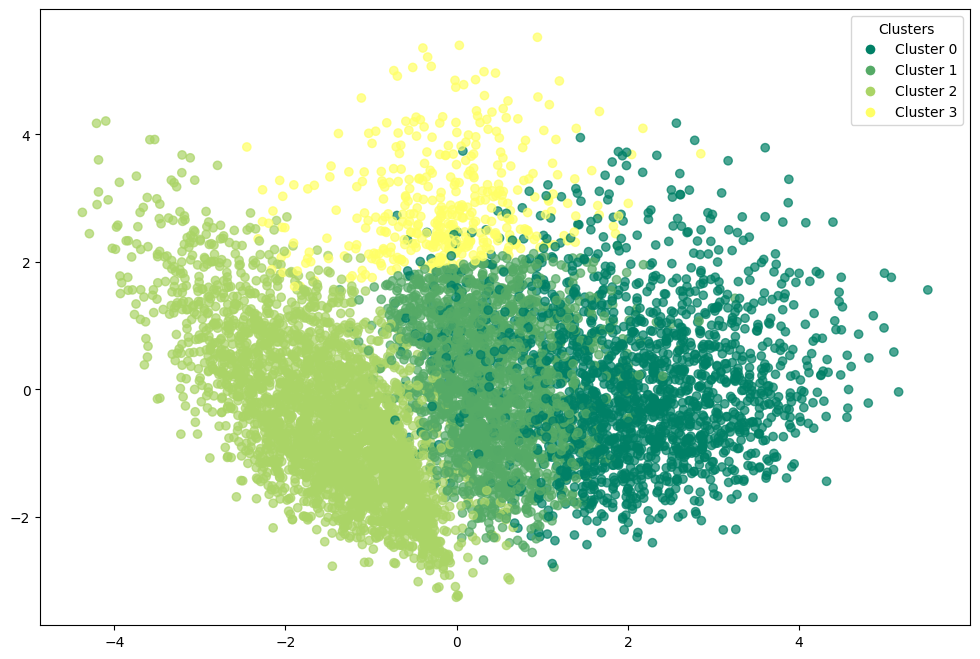

In [432]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_birch.iloc[:, 0], df_pca_birch.iloc[:, 1], 
                      c=df_pca_birch['birch_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_birch['birch_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [433]:
sil = silhouette_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
ch = calinski_harabasz_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
db = davies_bouldin_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.27052131054591605
Calinski-Harabasz: 2889.0216964812817
Davies-Bouldin: 1.075108396155002


### Birch with t-SNE

In [434]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [435]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,4
,compute_labels,True
,copy,'deprecated'


In [436]:
df_tsne_birch = X_tsne.copy()

In [437]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [438]:
df_tsne_birch

,dim_1,dim_2,birch_tsne
0,55.915588,-4.499386,1
1,-18.135302,56.300133,3
2,-29.342825,41.306011,3
3,-3.121587,40.886963,3
4,73.028496,17.787270,1
...,...,...,...
7087,-43.445213,-3.837628,2
7088,-35.263420,12.993477,2
7089,-9.176323,-71.482231,0
7090,-13.433419,-69.690445,0


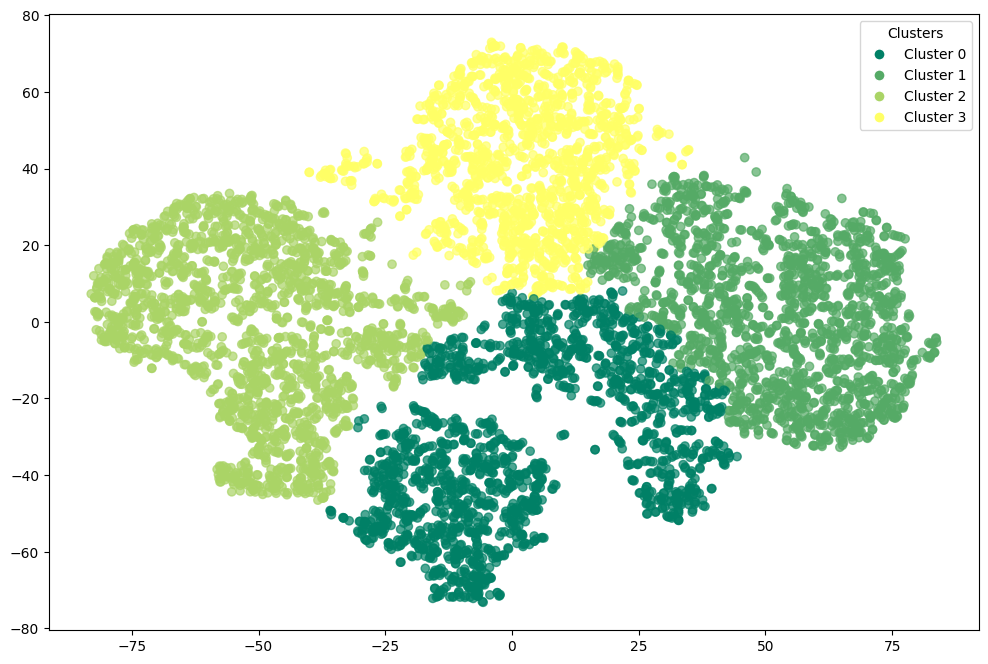

In [439]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [440]:
energy_scaled['birch_tsne'] = df_tsne_birch['birch_tsne']

In [441]:
energy_scaled.groupby('birch_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_tsne,,,,,,,,,,
0,-0.296432,-0.370004,-0.558615,-0.203121,-0.122361,-0.401472,-0.422633,-0.384306,-0.374075,-0.450359
1,-0.559931,0.664923,0.804736,1.282198,1.218776,-0.268131,0.041328,-0.005471,-0.473794,-0.169358
2,1.197406,-0.732291,-0.856301,-0.545884,-0.574988,0.727366,0.190593,0.128167,0.317862,0.201367
3,-0.569536,0.660338,0.898442,-0.530018,-0.517565,-0.152588,0.227380,0.318220,0.605275,0.497152


In [442]:
energy_scaled.drop('birch_tsne',axis=1,inplace=True)

In [443]:
sil = silhouette_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
ch = calinski_harabasz_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
db = davies_bouldin_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4196636974811554
Calinski-Harabasz: 7461.501084610157
Davies-Bouldin: 0.7922561502659415


### Birch with umap

In [444]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [445]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,4
,compute_labels,True
,copy,'deprecated'


In [446]:
df_umap_birch = X_umap.copy()

In [447]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [448]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap
0,8.540884,5.635366,8.092696,3
1,6.674550,7.703112,4.661761,1
2,8.055438,8.882436,5.173176,1
3,7.841428,6.987625,5.274173,1
4,9.224665,5.318230,7.319454,3
...,...,...,...,...
7087,0.898640,4.104914,6.800636,0
7088,0.870373,5.136365,5.973392,0
7089,-0.109102,8.384296,7.264081,0
7090,-0.318984,7.911990,6.649530,0


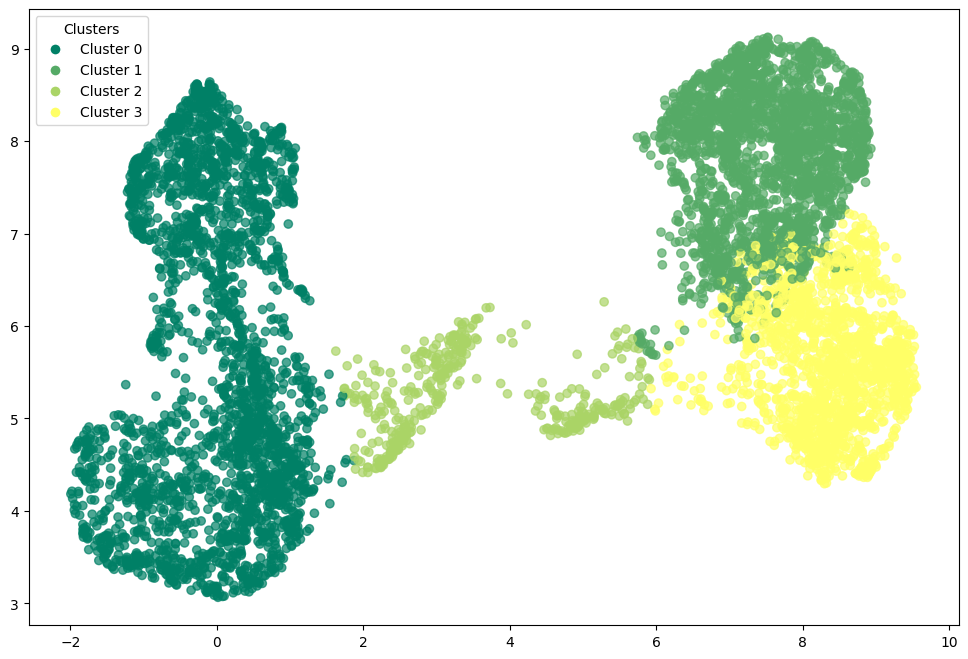

In [449]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [450]:
energy_scaled['birch_umap'] = df_umap_birch['birch_umap']

In [451]:
energy_scaled.groupby('birch_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_umap,,,,,,,,,,
0,0.589369,-0.909608,-0.857370,-0.555345,-0.588648,0.405565,-0.040315,0.042619,0.151480,0.052689
1,-0.562718,0.596651,0.662073,-0.427637,-0.289454,-0.227503,0.032491,-0.022960,0.273541,0.040606
2,1.395089,0.710188,-0.856385,0.037394,0.060351,-0.325916,-0.109287,-0.066938,0.002898,0.056256
3,-0.535422,0.512016,0.713413,1.518844,1.375258,-0.280040,0.048403,-0.022817,-0.637393,-0.158673


In [452]:
energy_scaled.drop('birch_umap',axis=1,inplace=True)

In [453]:
sil = silhouette_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
ch = calinski_harabasz_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
db = davies_bouldin_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.439451664686203
Calinski-Harabasz: 13087.204893541499
Davies-Bouldin: 0.8006482178314869


## GMM - Gaussian Mixture Models

In [454]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [455]:
gmm.fit(energy_scaled)

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [456]:
df_gmm = energy_scaled.copy()

In [457]:
df_gmm['gmm'] = gmm.predict(energy_scaled)

In [458]:
df_gmm

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,gmm
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,1
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,1
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,1
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,1
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


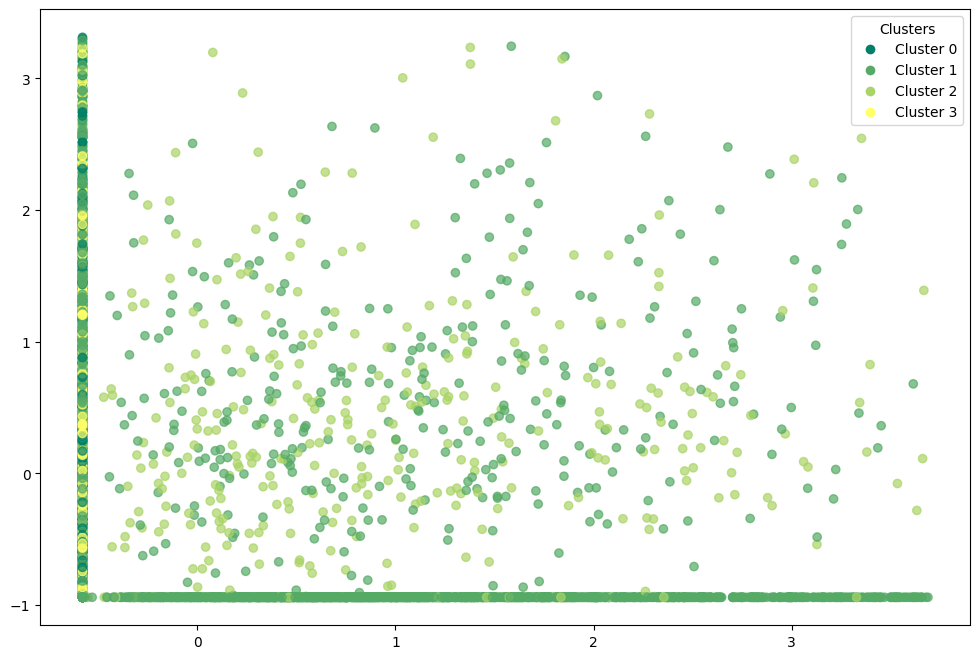

In [459]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [460]:
energy_scaled['gmm'] = df_gmm['gmm']

In [461]:
energy_scaled.groupby('gmm').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm,,,,,,,,,,
0,-0.579643,0.436899,0.995485,0.901984,1.180238,-0.428959,0.451133,0.410726,-0.054435,0.180639
1,0.219945,-0.270741,-0.280717,-0.572128,-0.610013,0.157253,-0.010203,0.055194,0.277331,0.135575
2,0.972866,0.218919,-0.791171,0.533606,0.873929,-0.056661,0.081164,-0.160213,-0.370990,-0.113496
3,-0.579643,0.504716,0.400223,1.061988,0.866304,-0.175222,-0.348562,-0.465194,-0.785065,-0.569061


In [462]:
energy_scaled.drop('gmm',axis=1,inplace=True)

In [463]:
sil = silhouette_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
ch = calinski_harabasz_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
db = davies_bouldin_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.08113074447858626
Calinski-Harabasz: 640.2086855109018
Davies-Bouldin: 2.6742922196664383


### GMM with pca

In [464]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [465]:
gmm_pca.fit(X_pca)

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [466]:
df_pca_gmm = X_pca.copy()

In [467]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [468]:
df_pca_gmm

,dim_1,dim_2,dim_3,gmm_pca
0,0.886679,1.363975,1.186636,3
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,3
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


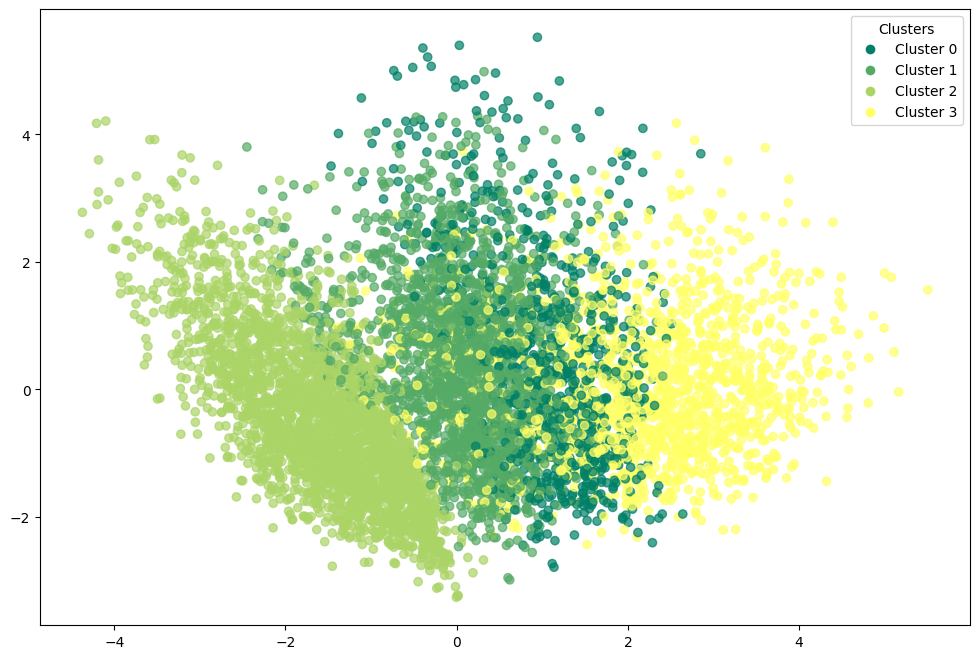

In [469]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [470]:
energy_scaled['gmm_pca'] = df_pca_gmm['gmm_pca']

In [471]:
energy_scaled.groupby('gmm_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_pca,,,,,,,,,,
0,-0.557992,0.546447,0.722123,0.222977,0.360065,-0.316069,0.208356,0.130872,-0.153762,0.029895
1,-0.508029,0.548787,0.480267,-0.532415,-0.491447,-0.290806,-0.170546,-0.046930,0.440837,0.128260
2,0.699820,-0.818726,-0.856593,-0.562486,-0.593813,0.421609,-0.039838,-0.008328,0.101758,-0.009943
3,-0.307055,0.482238,0.536308,1.604446,1.527245,-0.216868,0.170697,-0.002054,-0.669845,-0.166090


In [472]:
energy_scaled.drop('gmm_pca',axis=1,inplace=True)

In [473]:
sil = silhouette_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
ch = calinski_harabasz_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
db = davies_bouldin_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.2218329568730962
Calinski-Harabasz: 2306.5602548806205
Davies-Bouldin: 1.8929956385761115


### GMM with t-SNE

In [474]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [475]:
gmm_tsne.fit(X_tsne)

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [476]:
df_tsne_gmm = X_tsne.copy()

In [477]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [478]:
df_tsne_gmm

,dim_1,dim_2,gmm_tsne
0,55.915588,-4.499386,3
1,-18.135302,56.300133,0
2,-29.342825,41.306011,0
3,-3.121587,40.886963,0
4,73.028496,17.787270,3
...,...,...,...
7087,-43.445213,-3.837628,2
7088,-35.263420,12.993477,2
7089,-9.176323,-71.482231,1
7090,-13.433419,-69.690445,1


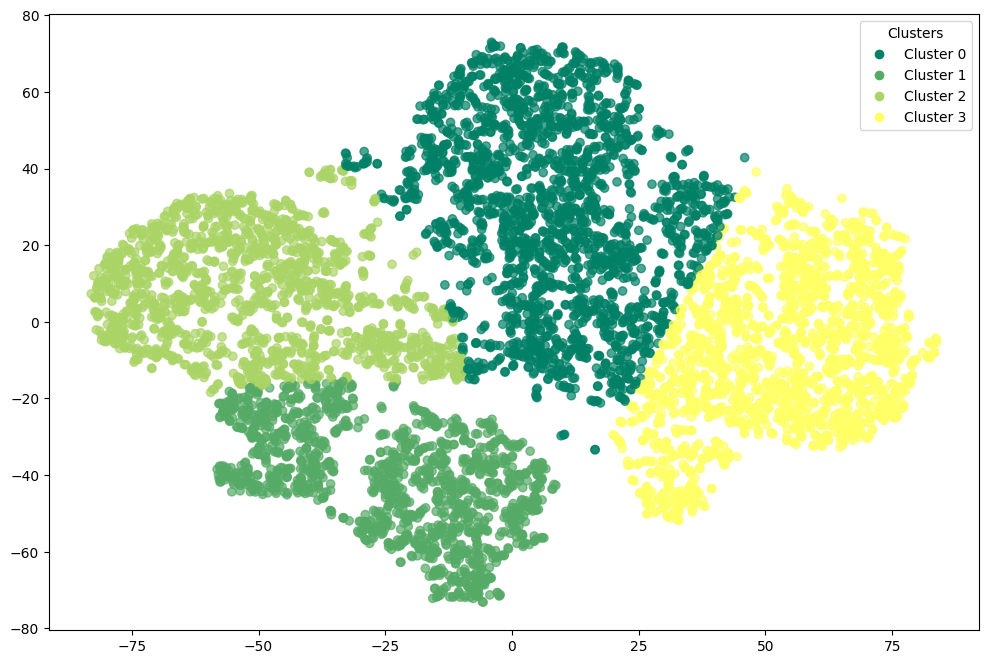

In [479]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [480]:
energy_scaled['gmm_tsne'] = df_tsne_gmm['gmm_tsne']

In [481]:
energy_scaled.groupby('gmm_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_tsne,,,,,,,,,,
0,-0.553897,0.615658,0.678631,-0.432227,-0.305038,-0.247238,0.053025,-0.004107,0.307385,0.099649
1,0.093460,-0.921352,-0.856959,-0.556521,-0.590516,-0.380783,-0.592184,-0.137376,-0.137027,-0.265134
2,1.150647,-0.610785,-0.836632,-0.541471,-0.568806,1.054578,0.427911,0.187385,0.417709,0.294968
3,-0.372897,0.476832,0.542966,1.464476,1.353002,-0.305189,0.026571,-0.049912,-0.648791,-0.175274


In [482]:
energy_scaled.drop('gmm_tsne',axis=1,inplace=True)

In [483]:
sil = silhouette_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
ch = calinski_harabasz_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
db = davies_bouldin_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.42755812406539917
Calinski-Harabasz: 7578.561221655355
Davies-Bouldin: 0.8010913107392064


### GMM with umap

In [484]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [485]:
gmm_umap.fit(X_umap)

,n_components,4
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [486]:
df_umap_gmm = X_umap.copy()

In [487]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [488]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap
0,8.540884,5.635366,8.092696,0
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


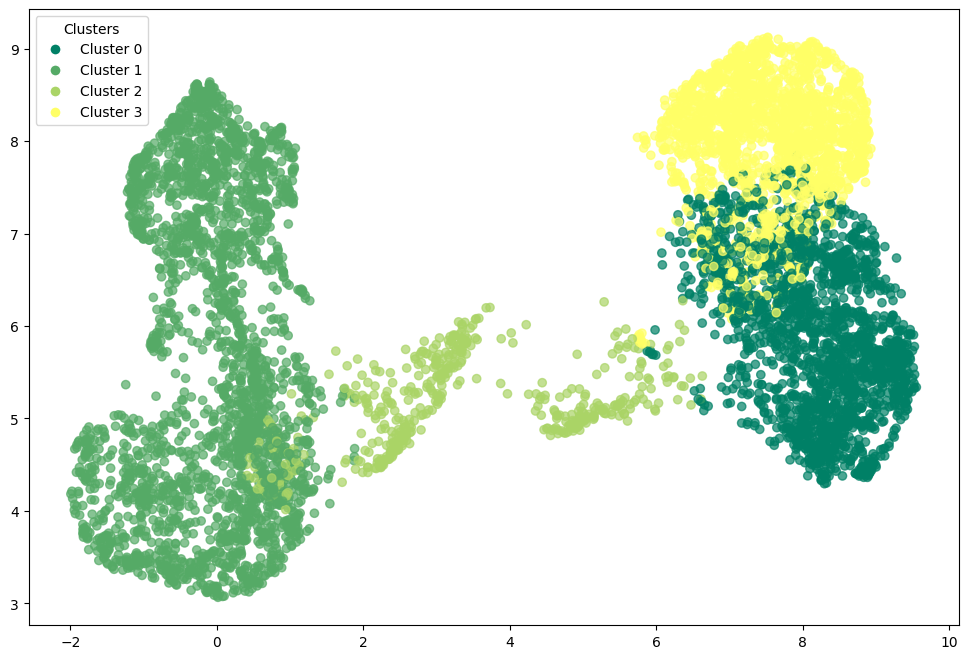

In [489]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [490]:
energy_scaled['gmm_umap'] = df_umap_gmm['gmm_umap']

In [491]:
energy_scaled.groupby('gmm_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_umap,,,,,,,,,,
0,-0.545777,0.485436,0.657922,1.235444,1.211760,-0.288099,0.011759,-0.100722,-0.549906,-0.247990
1,0.564174,-0.909278,-0.857131,-0.554661,-0.588217,0.429362,-0.028754,0.004650,0.133132,0.041797
2,1.364109,0.456234,-0.858359,-0.035910,0.095705,-0.363813,-0.183308,0.113322,0.082155,0.068709
3,-0.567820,0.648739,0.731196,-0.527117,-0.488441,-0.204944,0.075589,0.071745,0.378351,0.188219


In [492]:
energy_scaled.drop('gmm_umap',axis=1,inplace=True)

In [493]:
sil = silhouette_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
ch = calinski_harabasz_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
db = davies_bouldin_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4420209527015686
Calinski-Harabasz: 13391.207397474405
Davies-Bouldin: 0.8444528759057276


## pam

In [494]:
initial_medoids = np.random.choice(len(energy_scaled),N_CLUSTER,replace=False)

In [495]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [496]:
pam = kmedoids(energy_scaled.values.tolist(),initial_medoids,metric=metric)

In [497]:
pam.process()

In [498]:
clusters = pam.get_clusters()

In [499]:
medoids = pam.get_medoids()

In [500]:
labels = np.zeros(len(energy_scaled))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [501]:
df_pam = energy_scaled.copy()

In [502]:
df_pam['pam'] = labels

In [503]:
df_pam

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,pam
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,3.0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,2.0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2.0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,2.0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,3.0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,0.0
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,0.0
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1.0
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1.0


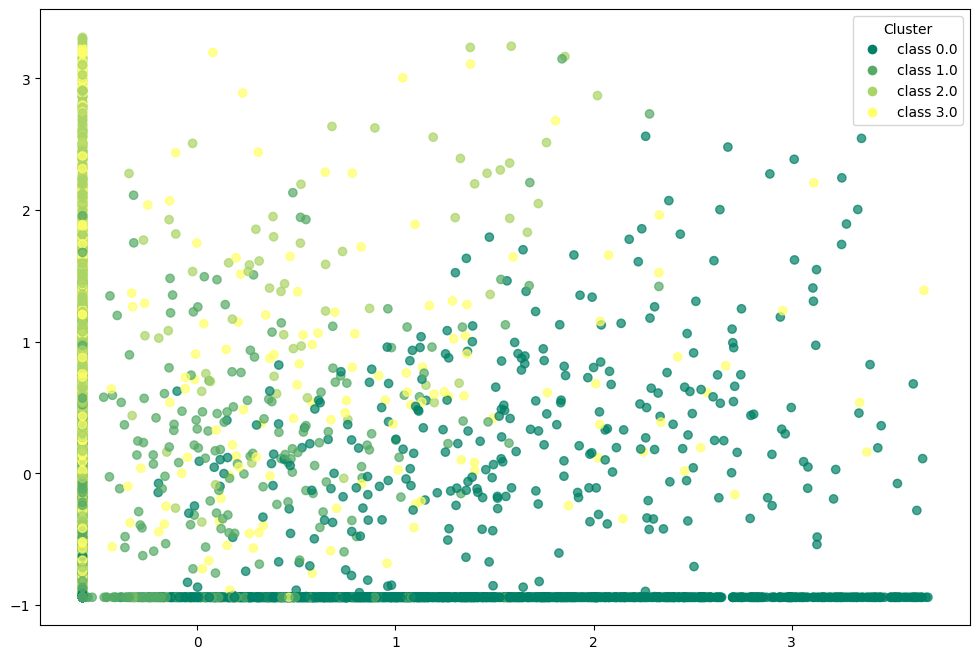

In [504]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [505]:
energy_scaled['pam'] = df_pam['pam']

In [506]:
energy_scaled.groupby('pam').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam,,,,,,,,,,
0.0,0.985357,-0.766962,-0.851018,-0.511514,-0.531297,0.605619,0.160063,0.309758,0.377120,0.315498
1.0,-0.374105,-0.335108,-0.432273,-0.364610,-0.359891,-0.401392,-0.465521,-0.724497,-0.591565,-0.738094
2.0,-0.536770,0.766929,0.912503,-0.392336,-0.316624,-0.182335,0.206104,0.322207,0.618200,0.444979
3.0,-0.448607,0.577731,0.629491,1.623437,1.556914,-0.275947,-0.006896,-0.103899,-0.700942,-0.246716


In [507]:
energy_scaled.drop('pam',axis=1,inplace=True)

In [508]:
sil = silhouette_score(df_pam.iloc[:,:-1], df_pam['pam'])
ch = calinski_harabasz_score(df_pam.iloc[:,:-1], df_pam['pam'])
db = davies_bouldin_score(df_pam.iloc[:,:-1], df_pam['pam'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.13896289011311114
Calinski-Harabasz: 1424.0207919609172
Davies-Bouldin: 1.6755943322919706


### pam with pca

In [509]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [510]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [511]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [512]:
pam_pca.process()

In [513]:
clusters = pam_pca.get_clusters()

In [514]:
medoids = pam_pca.get_medoids()

In [515]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [516]:
df_pam_pca = X_pca.copy()

In [517]:
df_pam_pca['pam_pca'] = labels

In [518]:
df_pam_pca

,dim_1,dim_2,dim_3,pam_pca
0,0.886679,1.363975,1.186636,0.0
1,-0.110236,-0.167015,-0.663318,1.0
2,-0.966315,2.136664,0.196361,2.0
3,0.073670,0.551620,-0.449555,2.0
4,1.649792,1.775372,1.256657,0.0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,3.0
7088,-1.573662,0.599975,0.321832,3.0
7089,-0.416653,-2.763515,-0.690737,1.0
7090,-0.618345,-2.158439,-0.582987,1.0


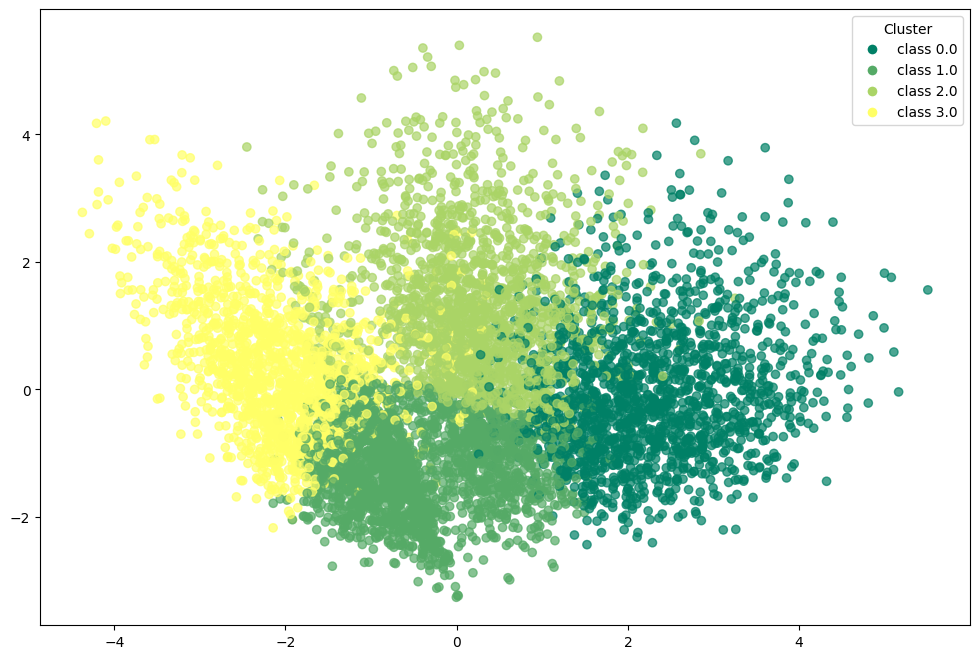

In [519]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [520]:
energy_scaled['pam_pca'] = df_pam_pca['pam_pca']

In [521]:
energy_scaled.groupby('pam_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_pca,,,,,,,,,,
0.0,-0.468436,0.554710,0.636634,1.515984,1.454799,-0.293829,0.012304,-0.113296,-0.701495,-0.292898
1.0,-0.149053,-0.443023,-0.579866,-0.469802,-0.466702,-0.211521,-0.511642,-0.560948,-0.349910,-0.586375
2.0,-0.545679,0.699963,0.878847,-0.403342,-0.332193,-0.243530,0.198997,0.388541,0.718764,0.571666
3.0,1.325456,-0.748545,-0.842423,-0.494380,-0.513582,0.888253,0.491040,0.481912,0.437386,0.503612


In [522]:
energy_scaled.drop('pam_pca',axis=1,inplace=True)

In [523]:
sil = silhouette_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
ch = calinski_harabasz_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
db = davies_bouldin_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3461671000751196
Calinski-Harabasz: 4226.980288700252
Davies-Bouldin: 0.9250522499130374


### pam with t-SNE

In [524]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [525]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [526]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [527]:
pam_tsne.process()

In [528]:
clusters = pam_tsne.get_clusters()

In [529]:
medoids = pam_tsne.get_medoids()

In [530]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [531]:
df_pam_tsne = X_tsne.copy()

In [532]:
df_pam_tsne['pam_tsne'] = labels

In [533]:
df_pam_tsne

,dim_1,dim_2,pam_tsne
0,55.915588,-4.499386,1.0
1,-18.135302,56.300133,3.0
2,-29.342825,41.306011,3.0
3,-3.121587,40.886963,3.0
4,73.028496,17.787270,1.0
...,...,...,...
7087,-43.445213,-3.837628,0.0
7088,-35.263420,12.993477,0.0
7089,-9.176323,-71.482231,2.0
7090,-13.433419,-69.690445,2.0


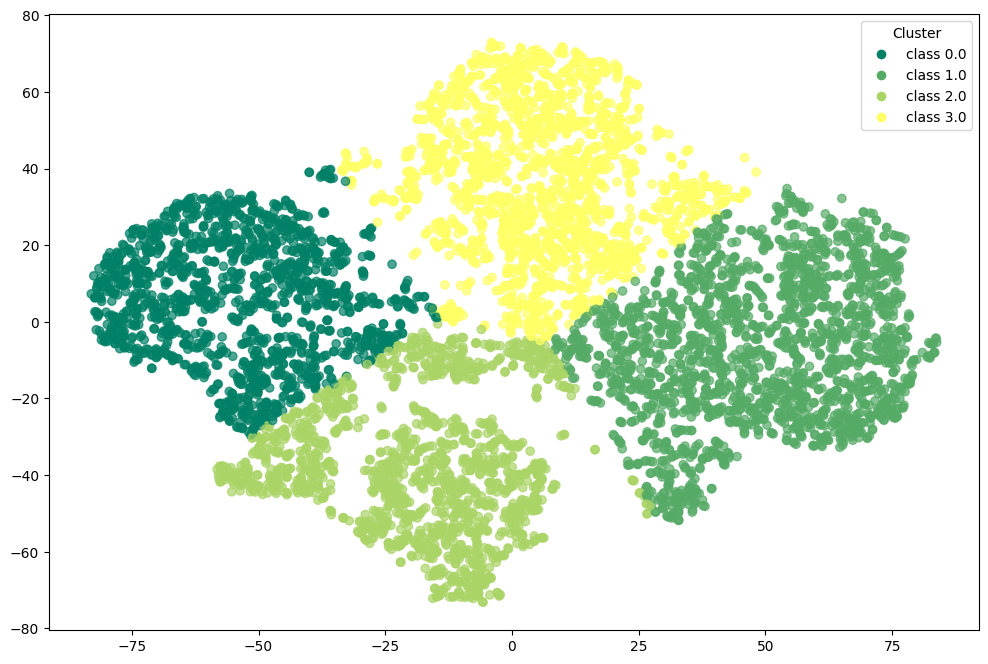

In [534]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [535]:
energy_scaled['pam_tsne'] = df_pam_tsne['pam_tsne']

In [536]:
energy_scaled.groupby('pam_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_tsne,,,,,,,,,,
0.0,1.285212,-0.750466,-0.842149,-0.546167,-0.573181,1.060559,0.405184,0.198077,0.409961,0.302893
1.0,-0.414903,0.458659,0.517990,1.266525,1.181869,-0.312156,0.008000,-0.138628,-0.636280,-0.229393
2.0,-0.037800,-0.672874,-0.804658,-0.536519,-0.564317,-0.384001,-0.575512,-0.231660,-0.194518,-0.369555
3.0,-0.566381,0.674136,0.794746,-0.526254,-0.384367,-0.202834,0.141496,0.188553,0.544669,0.321012


In [537]:
energy_scaled.drop('pam_tsne',axis=1,inplace=True)

In [538]:
sil = silhouette_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
ch = calinski_harabasz_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
db = davies_bouldin_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4560871124267578
Calinski-Harabasz: 8542.082405109539
Davies-Bouldin: 0.7551842870428387


### pam with umap

In [539]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [540]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [541]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [542]:
pam_umap.process()

In [543]:
clusters = pam_umap.get_clusters()

In [544]:
medoids = pam_umap.get_medoids()

In [545]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [546]:
df_pam_umap = X_umap.copy()

In [547]:
df_pam_umap['pam_umap'] = labels

In [548]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap
0,8.540884,5.635366,8.092696,0.0
1,6.674550,7.703112,4.661761,1.0
2,8.055438,8.882436,5.173176,1.0
3,7.841428,6.987625,5.274173,1.0
4,9.224665,5.318230,7.319454,0.0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,3.0
7088,0.870373,5.136365,5.973392,3.0
7089,-0.109102,8.384296,7.264081,2.0
7090,-0.318984,7.911990,6.649530,2.0


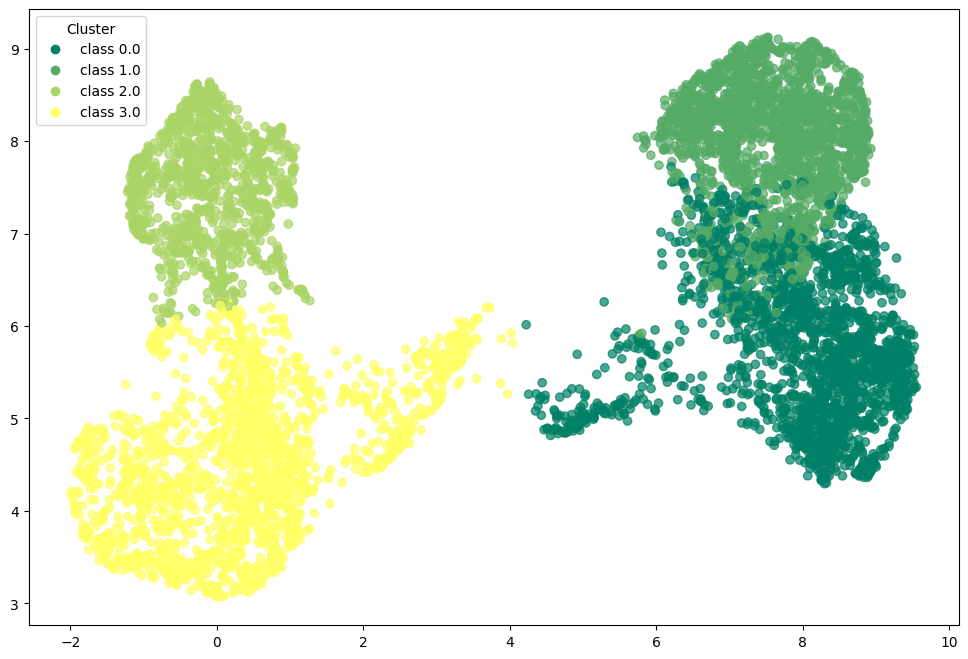

In [549]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [550]:
energy_scaled['pam_umap'] = df_pam_umap['pam_umap']

In [551]:
energy_scaled.groupby('pam_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_umap,,,,,,,,,,
0.0,-0.398455,0.457436,0.522839,1.283418,1.213544,-0.279268,-0.002101,-0.106284,-0.630636,-0.223036
1.0,-0.566799,0.662808,0.748349,-0.523363,-0.400468,-0.225440,0.083432,0.072655,0.414851,0.168885
2.0,-0.383543,-0.924959,-0.857201,-0.561112,-0.594791,-0.394599,-0.523311,-0.191772,-0.074656,-0.184712
3.0,1.258313,-0.655476,-0.857008,-0.543759,-0.575069,0.776273,0.222466,0.154308,0.308190,0.178804


In [552]:
energy_scaled.drop('pam_umap',axis=1,inplace=True)

In [553]:
sil = silhouette_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
ch = calinski_harabasz_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
db = davies_bouldin_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.4730064868927002
Calinski-Harabasz: 17301.305291279932
Davies-Bouldin: 0.8495677468575815


## spectral clustering

In [554]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [555]:
spectral_clustering.fit(energy_scaled)

,n_clusters,4
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [556]:
df_spectral = energy_scaled.copy()

In [557]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [558]:
df_spectral

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,spectral_clustering
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,3
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,3
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,3
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,2
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


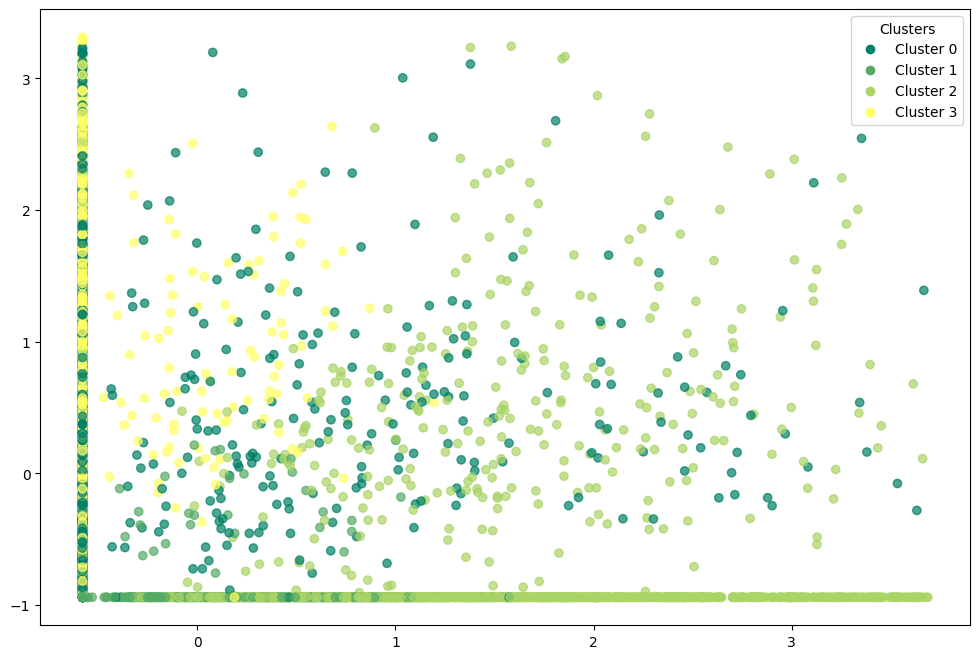

In [559]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [560]:
energy_scaled['spectral_clustering'] = df_spectral['spectral_clustering']

In [561]:
energy_scaled.groupby('spectral_clustering').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_clustering,,,,,,,,,,
0,-0.406747,0.464453,0.528455,1.298709,1.259964,-0.308466,-0.008464,-0.130644,-0.619000,-0.248724
1,-0.333274,-0.918662,-0.856962,-0.557597,-0.590612,-0.395789,-0.610569,-0.301295,-0.195993,-0.353289
2,1.261017,-0.697787,-0.842208,-0.535837,-0.567322,0.846279,0.272668,0.215156,0.315449,0.230219
3,-0.547657,0.645059,0.678359,-0.507377,-0.424042,-0.242612,0.085258,0.094608,0.430016,0.224404


In [562]:
energy_scaled.drop('spectral_clustering',axis=1,inplace=True)

In [563]:
sil = silhouette_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
ch = calinski_harabasz_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
db = davies_bouldin_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.11540570995797289
Calinski-Harabasz: 1271.0108436113308
Davies-Bouldin: 1.7871291896838566


### spectral clustering with pca

In [564]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [565]:
spectral_pca.fit(X_pca)

,n_clusters,4
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [566]:
df_pca_spectral = X_pca.copy()

In [567]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [568]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,0
1,-0.110236,-0.167015,-0.663318,3
2,-0.966315,2.136664,0.196361,3
3,0.073670,0.551620,-0.449555,3
4,1.649792,1.775372,1.256657,0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,1
7090,-0.618345,-2.158439,-0.582987,1


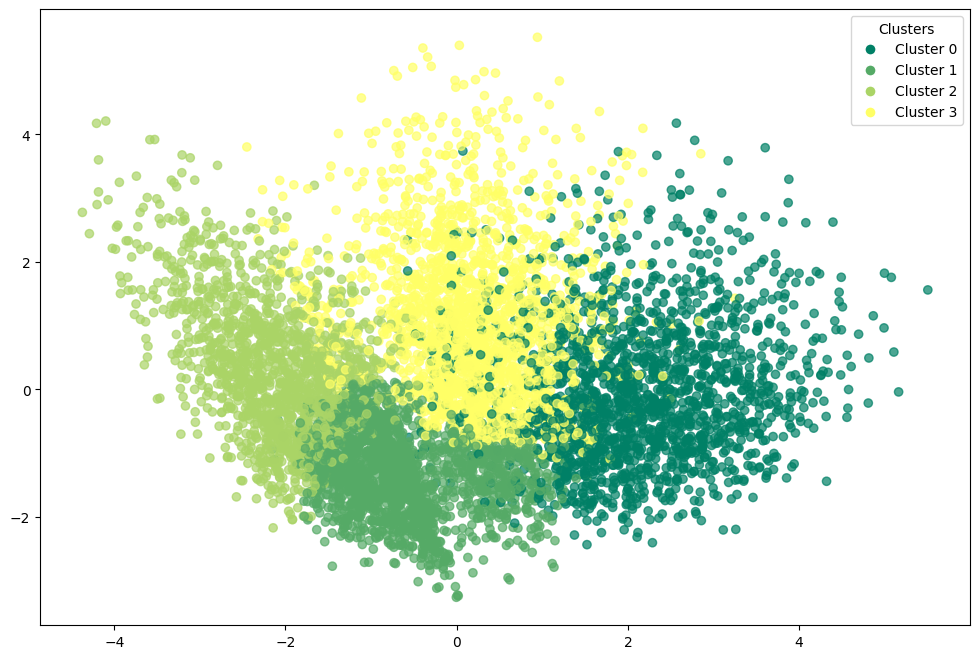

In [569]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [570]:
energy_scaled['spectral_pca'] = df_pca_spectral['spectral_pca']

In [571]:
energy_scaled.groupby('spectral_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_pca,,,,,,,,,,
0,-0.405687,0.507237,0.568435,1.442349,1.393025,-0.281466,0.054739,-0.083365,-0.679604,-0.256444
1,-0.088693,-0.566826,-0.684192,-0.494277,-0.495567,-0.186979,-0.523022,-0.554013,-0.372552,-0.595137
2,1.363226,-0.787971,-0.853324,-0.542968,-0.578182,0.943448,0.485764,0.475215,0.473274,0.501765
3,-0.537889,0.667169,0.773981,-0.440767,-0.368514,-0.248394,0.107668,0.272441,0.642642,0.452099


In [572]:
energy_scaled.drop('spectral_pca',axis=1,inplace=True)

In [573]:
sil = silhouette_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
ch = calinski_harabasz_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
db = davies_bouldin_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3321397699343888
Calinski-Harabasz: 4013.510216492976
Davies-Bouldin: 0.9577448299824294


In [574]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,0
1,-0.110236,-0.167015,-0.663318,3
2,-0.966315,2.136664,0.196361,3
3,0.073670,0.551620,-0.449555,3
4,1.649792,1.775372,1.256657,0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,1
7090,-0.618345,-2.158439,-0.582987,1


### spectral clustering with t-SNE

In [575]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [576]:
spectral_tsne.fit(X_tsne)

,n_clusters,4
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [577]:
df_tsne_spectral = X_tsne.copy()

In [578]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [579]:
df_tsne_spectral

,dim_1,dim_2,spectral_tsne
0,55.915588,-4.499386,0
1,-18.135302,56.300133,0
2,-29.342825,41.306011,2
3,-3.121587,40.886963,0
4,73.028496,17.787270,0
...,...,...,...
7087,-43.445213,-3.837628,1
7088,-35.263420,12.993477,1
7089,-9.176323,-71.482231,1
7090,-13.433419,-69.690445,1


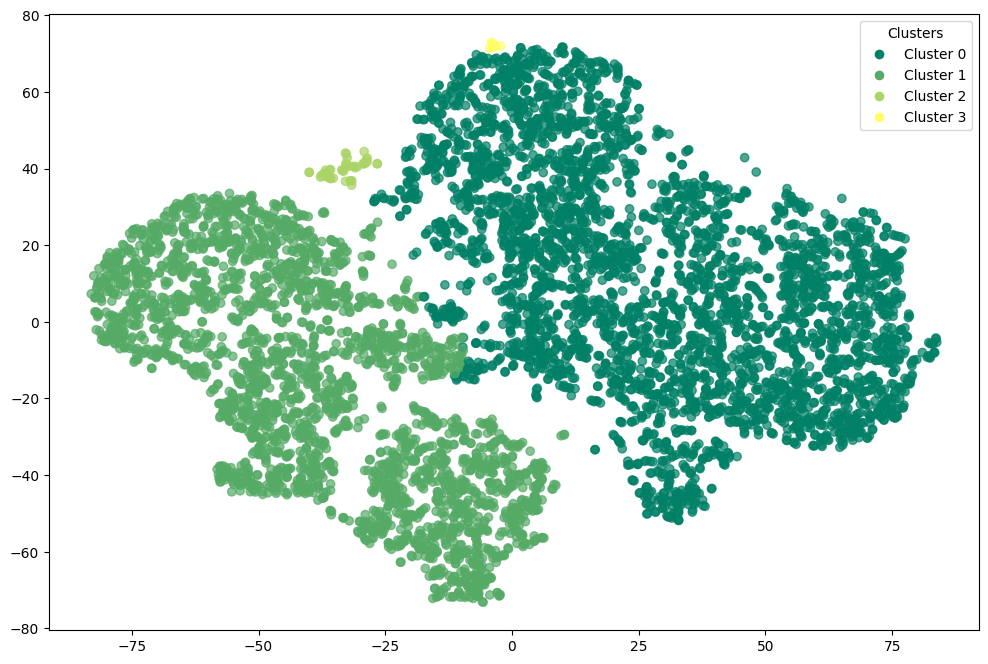

In [580]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [581]:
energy_scaled['spectral_tsne'] = df_tsne_spectral['spectral_tsne']

In [582]:
energy_scaled.groupby('spectral_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_tsne,,,,,,,,,,
0,-0.472188,0.544251,0.602466,0.399206,0.421664,-0.287133,0.042224,-0.023618,-0.116828,-0.016082
1,0.668746,-0.765512,-0.855354,-0.547358,-0.578143,0.362903,-0.063522,0.028901,0.147467,0.013661
2,-0.579643,0.269389,0.442065,-0.518865,-0.547185,2.739994,0.366500,0.201198,0.538642,-0.072014
3,-0.579643,0.786246,2.606481,-0.572128,-0.610013,-0.476622,-0.175526,0.341680,2.281886,2.879923


In [583]:
energy_scaled.drop('spectral_tsne',axis=1,inplace=True)

In [584]:
sil = silhouette_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
ch = calinski_harabasz_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
db = davies_bouldin_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.1434674859046936
Calinski-Harabasz: 2091.710550362513
Davies-Bouldin: 0.7810383472920714


### spectral clustering with umap

In [585]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [586]:
spectral_umap.fit(X_umap)

,n_clusters,4
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [587]:
df_umap_spectral = X_umap.copy()

In [588]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [589]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap
0,8.540884,5.635366,8.092696,0
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,2
7090,-0.318984,7.911990,6.649530,2


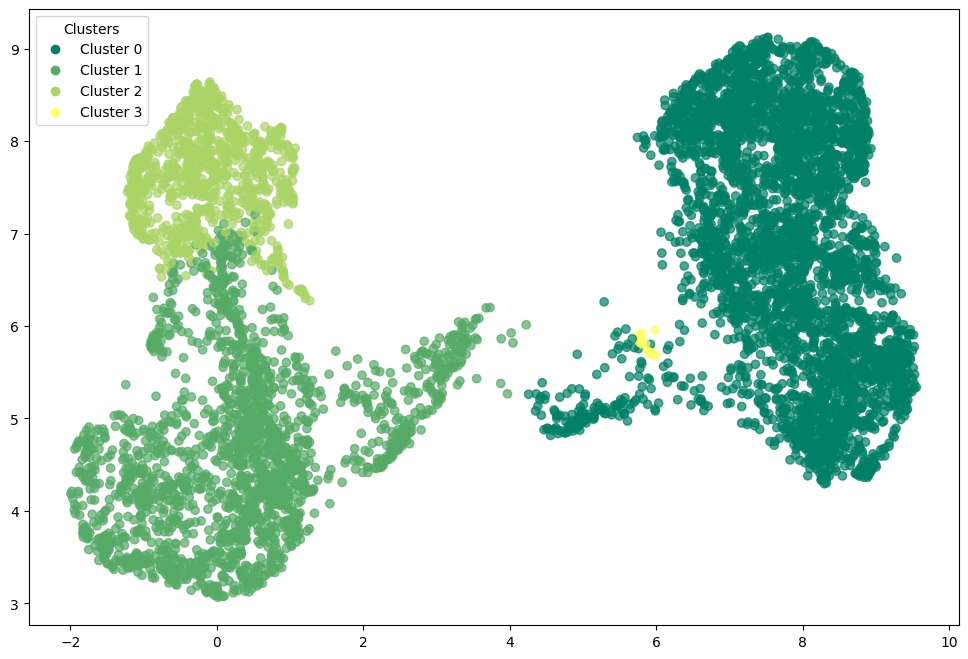

In [590]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [591]:
energy_scaled['spectral_umap'] = df_umap_spectral['spectral_umap']

In [592]:
energy_scaled.groupby('spectral_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_umap,,,,,,,,,,
0,-0.480034,0.561521,0.634750,0.410493,0.432922,-0.267652,0.039885,-0.018204,-0.120120,-0.028920
1,1.213583,-0.672170,-0.857653,-0.543408,-0.575416,0.699927,0.167805,0.087730,0.260395,0.122345
2,-0.510506,-0.926111,-0.855906,-0.563654,-0.596005,-0.394437,-0.509961,-0.101877,-0.028214,-0.118117
3,-0.579643,-0.278658,0.222358,-0.497836,-0.213569,2.712211,-0.055883,-0.197562,-0.645995,-0.735641


In [593]:
energy_scaled.drop('spectral_umap',axis=1,inplace=True)

In [594]:
sil = silhouette_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
ch = calinski_harabasz_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
db = davies_bouldin_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.20203393697738647
Calinski-Harabasz: 8690.293334435932
Davies-Bouldin: 0.9739773480698937


# internal measures

Internal validation metrics evaluate clustering **without requiring ground truth labels**, based on cohesion (how close points are within a cluster) and separation (how far clusters are from each other).

---

## Silhouette Score

The **Silhouette Score** measures how similar a point is to its own cluster compared to other clusters.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to points in **other clusters** (nearest cluster separation).  
3. Silhouette score `s(i)`:
   \[
   s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
   \]
4. Overall score = average `s(i)` across all points.

**Interpretation:**
- `s ≈ 1` → point is well-clustered  
- `s ≈ 0` → point near cluster boundary  
- `s < 0` → point may be misclassified

**Strengths**
- Works without ground truth  
- Measures both cohesion and separation  
- Useful for estimating the optimal number of clusters  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to distance metric choice  

---

## Davies–Bouldin Index (DBI)

The **Davies–Bouldin Index** evaluates clustering based on **average similarity between clusters**. It quantifies the ratio of intra-cluster distance to inter-cluster separation.

1. For each cluster `i`, compute **average intra-cluster distance** `S_i`.  
2. For each pair of clusters `(i, j)`, compute **inter-cluster distance** `M_ij` between centroids.  
3. Compute the ratio `R_ij = (S_i + S_j) / M_ij`.  
4. For each cluster `i`, take `R_i = max_j R_ij`.  
5. DBI = average of all `R_i`.

**Interpretation:**
- **Lower DBI** → better clustering (clusters are compact and well-separated)  
- **Higher DBI** → clusters are overlapping or poorly separated

**Strengths**
- Does not require ground truth  
- Considers both cluster compactness and separation  

**Weaknesses**
- Sensitive to cluster shape and scale  
- Can favor algorithms that produce more clusters  

---

## Calinski–Harabasz Index (Variance Ratio Criterion)

The **Calinski–Harabasz Index (CH Index)** evaluates clustering using the **ratio of between-cluster dispersion to within-cluster dispersion**.

1. Compute **between-cluster dispersion** `B_k` (sum of squared distances between cluster centroids and overall mean).  
2. Compute **within-cluster dispersion** `W_k` (sum of squared distances of points to their cluster centroids).  
3. Compute the index:
\[
CH = \frac{B_k / (k-1)}{W_k / (n-k)}
\]
where `k` = number of clusters, `n` = number of points.

**Interpretation:**
- **Higher CH** → better clustering (dense and well-separated clusters)  
- Can be used to select the optimal number of clusters

**Strengths**
- Simple and fast to compute  
- Works without ground truth  
- Effective for convex, well-separated clusters  

**Weaknesses**
- Assumes clusters are roughly spherical  
- Sensitive to noise and outliers  

---

## Summary Table

| Metric | Ground Truth Required | Range | Meaning |
|--------|---------------------|-------|---------|
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-clustered, 0 = boundary, <0 = misclassified |
| **Davies–Bouldin Index** | ❌ | [0, ∞) | Lower is better (compact & separated clusters) |
| **Calinski–Harabasz Index** | ❌ | [0, ∞) | Higher is better (dense & well-separated clusters) |

In [595]:
results = {}

def evaluate_clustering(X, y_pred):

    scores = {
        "Silhouette": silhouette_score(X, y_pred),
        "Davies Bouldin": davies_bouldin_score(X, y_pred),
        "Calinski Harabasz": calinski_harabasz_score(X, y_pred),
        
    }
    return scores

def evaluate_and_store(name, X, y_pred):
    scores = evaluate_clustering(X, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",df_kmeans.drop(['k_means'],axis=1).values,df_kmeans['k_means'])

evaluate_and_store("k-means + pca",df_pca_kmeans.drop(['kmeans_pca'],axis=1).values,df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",df_tsne_kmeans.drop(['kmeans_tsne'],axis=1).values,df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",df_umap_kmeans.drop(['kmeans_umap'],axis=1).values,df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",df_birch.drop(['birch'],axis=1).values,df_birch['birch'])

evaluate_and_store("Birch + pca",df_pca_birch.drop(['birch_pca'],axis=1).values,df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",df_tsne_birch.drop(['birch_tsne'],axis=1).values,df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",df_umap_birch.drop(['birch_umap'],axis=1).values,df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",df_gmm.drop(['gmm'],axis=1).values,df_gmm['gmm'])

evaluate_and_store("GMM + pca",df_pca_gmm.drop(['gmm_pca'],axis=1).values,df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",df_tsne_gmm.drop(['gmm_tsne'],axis=1).values,df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",df_umap_gmm.drop(['gmm_umap'],axis=1).values,df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",df_pam.drop(['pam'],axis=1).values,df_pam['pam'])

evaluate_and_store("PAM + pca",df_pam_pca.drop(['pam_pca'],axis=1).values,df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",df_pam_tsne.drop(['pam_tsne'],axis=1).values,df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",df_pam_umap.drop(['pam_umap'],axis=1).values,df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",df_spectral.drop(['spectral_clustering'],axis=1).values,df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",df_pca_spectral.drop(['spectral_pca'],axis=1).values,df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",df_tsne_spectral.drop(['spectral_tsne'],axis=1).values,df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",df_umap_spectral.drop(['spectral_umap'],axis=1).values,df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                            Silhouette  Davies Bouldin  Calinski Harabasz
k-means                          0.189           1.600           1522.790
k-means + pca                    0.352           0.911           4281.505
k-means + tsne                   0.456           0.757           8549.980
k-means + umap                   0.493           0.878          13465.522
Birch                            0.118           2.113            882.493
Birch + pca                      0.271           1.075           2889.022
Birch + tsne                     0.420           0.792           7461.501
Birch + umap                     0.439           0.801          13087.205
GMM                              0.081           2.674            640.209
GMM + pca                        0.222           1.893           2306.560
GMM + tsne                       0.428           0.801           7578.561
GMM + umap                       0.442           0.844          13391.207
PAM                              0.139

In [596]:
df_results

,Silhouette,Davies Bouldin,Calinski Harabasz
k-means,0.189,1.600,1522.790
k-means + pca,0.352,0.911,4281.505
k-means + tsne,0.456,0.757,8549.980
k-means + umap,0.493,0.878,13465.522
Birch,0.118,2.113,882.493
Birch + pca,0.271,1.075,2889.022
Birch + tsne,0.420,0.792,7461.501
Birch + umap,0.439,0.801,13087.205
GMM,0.081,2.674,640.209
GMM + pca,0.222,1.893,2306.560


# working area

In [597]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,3
2,8.055438,8.882436,5.173176,3
3,7.841428,6.987625,5.274173,3
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


In [598]:
df_umap_kmeans['state'] = energy_complete['state_postal']

In [599]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,state
0,8.540884,5.635366,8.092696,2,NM
1,6.674550,7.703112,4.661761,3,NaN
2,8.055438,8.882436,5.173176,3,NaN
3,7.841428,6.987625,5.274173,3,SC
4,9.224665,5.318230,7.319454,2,NaN
...,...,...,...,...,...
7087,0.898640,4.104914,6.800636,1,NV
7088,0.870373,5.136365,5.973392,1,MT
7089,-0.109102,8.384296,7.264081,1,NaN
7090,-0.318984,7.911990,6.649530,1,FL


In [600]:
df_umap_kmeans.isna().sum()

dim_1             0
dim_2             0
dim_3             0
kmeans_umap       0
state          2415
dtype: int64

In [601]:
map = df_umap_kmeans.groupby('state')['kmeans_umap'].agg(lambda x: x.value_counts().idxmax()).reset_index(name='dominant_cluster')

In [602]:
map

,state,dominant_cluster
0,AK,1
1,AL,1
2,AR,1
3,AZ,1
4,CA,1
5,CO,1
6,CT,1
7,DC,1
8,DE,1
9,FL,1


In [603]:
import geopandas as gpd

url = "https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_20m.zip"
states = gpd.read_file(url)
merged = states.merge(map, left_on='STUSPS', right_on='state', how='left')

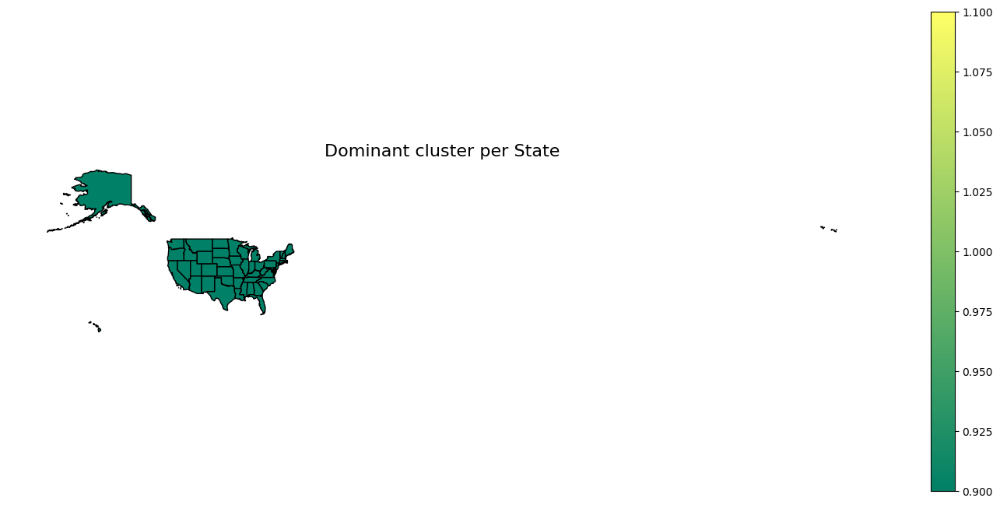

In [604]:
fig, ax = plt.subplots(figsize=(18, 8))
merged.plot(
    column='dominant_cluster',
    cmap='summer',
    legend=True,
    ax=ax,
    edgecolor='black',
)
plt.title('Dominant cluster per State', fontsize=16)
plt.axis('off')
plt.show()